In [1]:
import pandas as pd
import time

In [2]:
start=time.perf_counter()

In [3]:
from DatabaseCreator import DatabaseCreator
import CJDH_local_settings

#Run Database Creator
if __name__ == "__main__":
    db_creator = DatabaseCreator(db_settings=CJDH_local_settings.local_settings['FPL_Points_Predictor'])
    fpl_engine = db_creator.get_engine_for("fpl_data_analysis")

In [4]:
from FPLPredictor import FPLPredictor

In [5]:
#add this info to a settings dict?
stats_current_gameweek = 12
picks_current_gameweek = 12
current_season = 20252026

In [6]:
# Load df from sql
df = db_creator.run_sql("""SELECT *
                        FROM playergw_transformed
                          """)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146840 entries, 0 to 146839
Columns: 293 entries, player_name_id to saves_elo_adj_per90_running_avg_prev_10
dtypes: float64(288), object(5)
memory usage: 328.2+ MB


In [7]:
df[(df['season']==current_season)
   &(df['team_name']=='Arsenal')
#    &(df['event']==9)
   &(df['player_name_id']=='Bukayo Saka')
   ][['player_name_id','event','total_points','opp_team_name']].sort_values(by='event')

,player_name_id,event,total_points,opp_team_name
131920,Bukayo Saka,1.0,3.0,Man Utd
131921,Bukayo Saka,2.0,6.0,Leeds
131922,Bukayo Saka,3.0,0.0,Liverpool
131923,Bukayo Saka,4.0,0.0,Nott'm Forest
131726,Bukayo Saka,5.0,1.0,Man City
131729,Bukayo Saka,6.0,2.0,Newcastle
131924,Bukayo Saka,7.0,8.0,West Ham
131925,Bukayo Saka,8.0,7.0,Fulham
131927,Bukayo Saka,9.0,3.0,Crystal Palace
131928,Bukayo Saka,10.0,3.0,Burnley


In [8]:
cbi_defcon_cols = ['cbi_alltime_avg',
 'cbi_per90_alltime_avg',
 'cbi_running_avg_prev_3',
 'cbi_per90_running_avg_prev_3',
 'cbi_elo_adj_running_avg_prev_3',
 'cbi_elo_adj_per90_running_avg_prev_3',
 'cbi_running_avg_prev_5',
 'cbi_per90_running_avg_prev_5',
 'cbi_elo_adj_running_avg_prev_5',
 'cbi_elo_adj_per90_running_avg_prev_5',
 'cbi_running_avg_prev_10',
 'cbi_per90_running_avg_prev_10',
 'cbi_elo_adj_running_avg_prev_10',
 'cbi_elo_adj_per90_running_avg_prev_10',
 'defensive_contribution_alltime_avg',
 'defensive_contribution_per90_alltime_avg',
 'defensive_contribution_running_avg_prev_3',
 'defensive_contribution_per90_running_avg_prev_3',
 'defensive_contribution_elo_adj_running_avg_prev_3',
 'defensive_contribution_elo_adj_per90_running_avg_prev_3',
 'defensive_contribution_running_avg_prev_5',
 'defensive_contribution_per90_running_avg_prev_5',
 'defensive_contribution_elo_adj_running_avg_prev_5',
 'defensive_contribution_elo_adj_per90_running_avg_prev_5',
 'defensive_contribution_running_avg_prev_10',
 'defensive_contribution_per90_running_avg_prev_10',
 'defensive_contribution_elo_adj_running_avg_prev_10',
 'defensive_contribution_elo_adj_per90_running_avg_prev_10',
 'saves_alltime_avg',
 'saves_per90_alltime_avg',
 'saves_running_avg_prev_3',
 'saves_per90_running_avg_prev_3',
 'saves_elo_adj_running_avg_prev_3',
 'saves_elo_adj_per90_running_avg_prev_3',
 'saves_running_avg_prev_5',
 'saves_per90_running_avg_prev_5',
 'saves_elo_adj_running_avg_prev_5',
 'saves_elo_adj_per90_running_avg_prev_5',
 'saves_running_avg_prev_10',
 'saves_per90_running_avg_prev_10',
 'saves_elo_adj_running_avg_prev_10',
 'saves_elo_adj_per90_running_avg_prev_10',
 'recoveries_alltime_avg',
 'recoveries_per90_alltime_avg',
 'recoveries_running_avg_prev_3',
 'recoveries_per90_running_avg_prev_3',
 'recoveries_elo_adj_running_avg_prev_3',
 'recoveries_elo_adj_per90_running_avg_prev_3',
 'recoveries_running_avg_prev_5',
 'recoveries_per90_running_avg_prev_5',
 'recoveries_elo_adj_running_avg_prev_5',
 'recoveries_elo_adj_per90_running_avg_prev_5',
 'recoveries_running_avg_prev_10',
 'recoveries_per90_running_avg_prev_10',
 'recoveries_elo_adj_running_avg_prev_10',
 'recoveries_elo_adj_per90_running_avg_prev_10',
 'tackles_alltime_avg',
 'tackles_per90_alltime_avg',
 'tackles_running_avg_prev_3',
 'tackles_per90_running_avg_prev_3',
 'tackles_elo_adj_running_avg_prev_3',
 'tackles_elo_adj_per90_running_avg_prev_3',
 'tackles_running_avg_prev_5',
 'tackles_per90_running_avg_prev_5',
 'tackles_elo_adj_running_avg_prev_5',
 'tackles_elo_adj_per90_running_avg_prev_5',
 'tackles_running_avg_prev_10',
 'tackles_per90_running_avg_prev_10',
 'tackles_elo_adj_running_avg_prev_10',
 'tackles_elo_adj_per90_running_avg_prev_10']

In [9]:
# #restricts to player_name_id who have >0 minutes in that season
# #model struggles to predict higher values, so maybe cut-off points at 10, or try log(points) as a depvar
# for each indepvar: filter outliers & standardize

Cleaned df size: 7418/13826

Training Set Performance:
R² Score: 0.8043
RMSE: 16.1507
MAE: 11.6999

Test Set Performance:
R² Score: 0.5398
RMSE: 25.2975
MAE: 18.0689

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.553936
                          minutes_elo_adj_running_avg_prev_3    0.071094
                                  minutes_running_avg_prev_5    0.009886
                                                opp_team_elo    0.007363
                    goals_scored_elo_adj_running_avg_prev_10    0.007334
                            opp_team_elo_running_avg_prev_10    0.007206
                                 minutes_running_avg_prev_10    0.006498
                   minutes_elo_adj_per90_running_avg_prev_10    0.006492
                             opp_team_elo_running_avg_prev_3    0.006327
                                                    elo_diff    0.006224
          

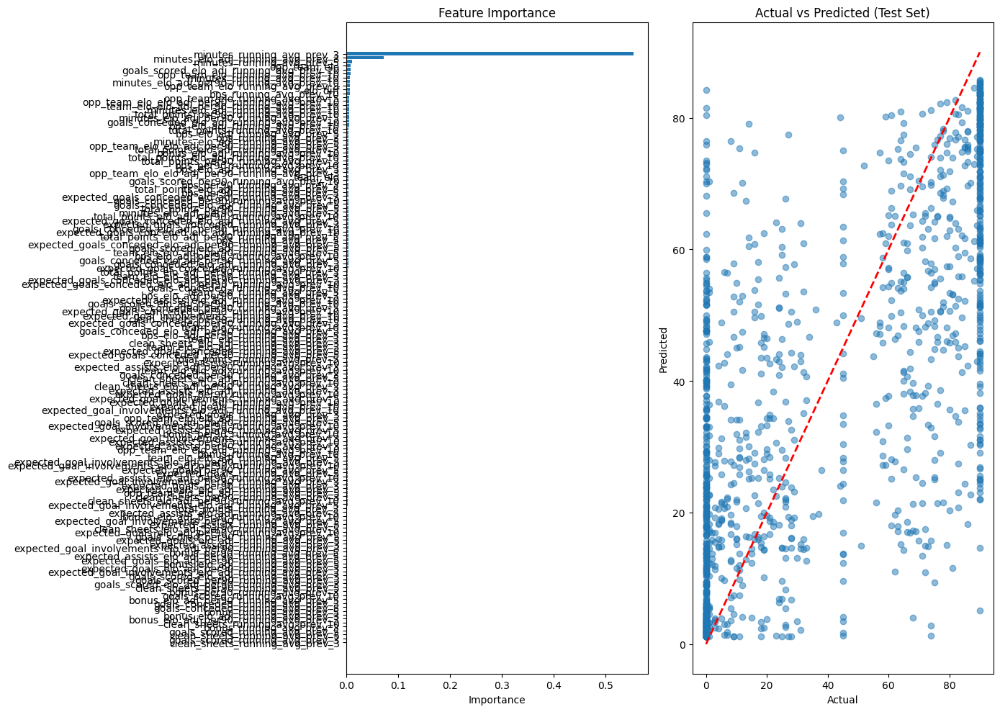

Cleaned df size: 28665/49859

Training Set Performance:
R² Score: 0.6895
RMSE: 21.3981
MAE: 15.6528

Test Set Performance:
R² Score: 0.5356
RMSE: 26.1200
MAE: 18.8696

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.722946
                          minutes_elo_adj_running_avg_prev_3    0.020461
                                  minutes_running_avg_prev_5    0.011312
                                     bps_running_avg_prev_10    0.007808
                                 minutes_running_avg_prev_10    0.007061
                          minutes_elo_adj_running_avg_prev_5    0.006466
                            opp_team_elo_running_avg_prev_10    0.004524
                                                opp_team_elo    0.004333
                                                    elo_diff    0.004221
                             opp_team_elo_running_avg_prev_3    0.003986
         

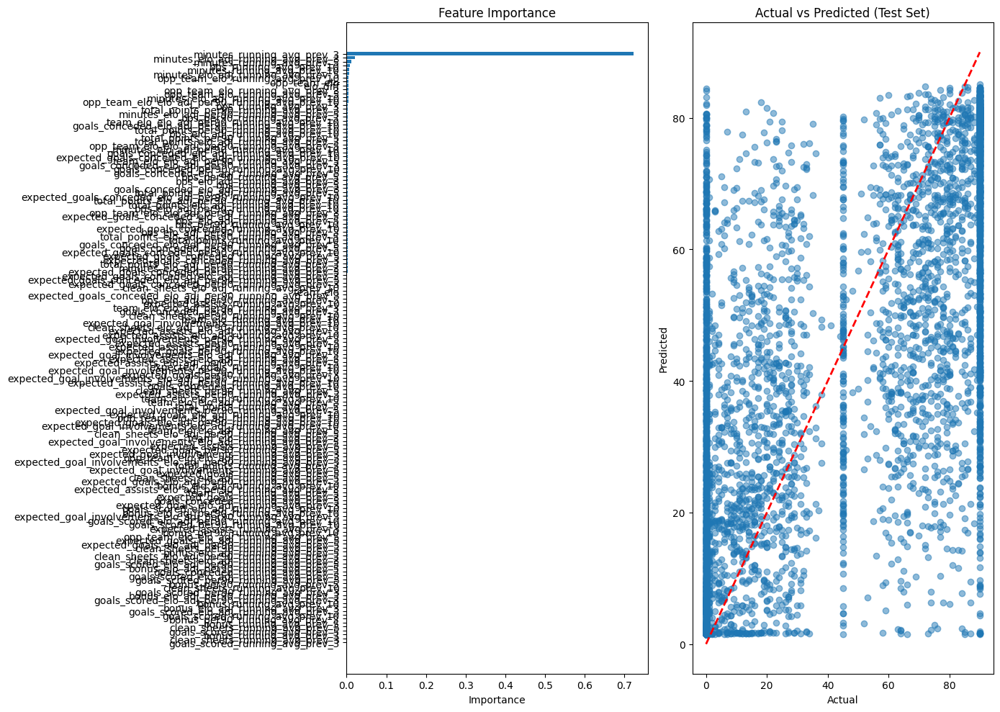

Cleaned df size: 21731/39073

Training Set Performance:
R² Score: 0.6586
RMSE: 24.6691
MAE: 18.1573

Test Set Performance:
R² Score: 0.4666
RMSE: 30.7913
MAE: 22.6180

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.704744
                          minutes_elo_adj_running_avg_prev_3    0.015289
                                 minutes_running_avg_prev_10    0.008260
                            opp_team_elo_running_avg_prev_10    0.007015
                                                opp_team_elo    0.006389
                             opp_team_elo_running_avg_prev_5    0.006014
                             opp_team_elo_running_avg_prev_3    0.005983
                                                    elo_diff    0.005894
                                     bps_running_avg_prev_10    0.004867
                                  minutes_running_avg_prev_5    0.004512
         

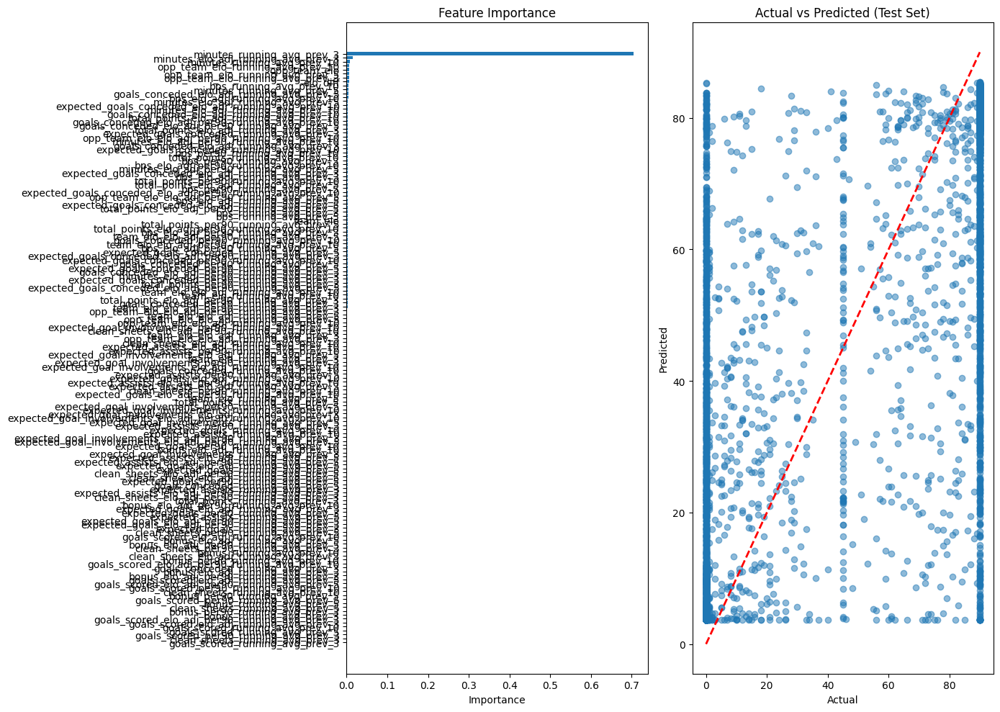

Cleaned df size: 4645/8287

Training Set Performance:
R² Score: 0.8423
RMSE: 17.7583
MAE: 9.9221

Test Set Performance:
R² Score: 0.7078
RMSE: 24.1830
MAE: 13.9980

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.419479
                     total_points_elo_adj_running_avg_prev_3    0.125032
                          minutes_elo_adj_running_avg_prev_3    0.072211
                             total_points_running_avg_prev_3    0.041057
                       total_points_per90_running_avg_prev_3    0.035500
               total_points_elo_adj_per90_running_avg_prev_3    0.030005
                        bps_elo_adj_per90_running_avg_prev_3    0.009817
                            opp_team_elo_running_avg_prev_10    0.009533
                                                opp_team_elo    0.008672
                             opp_team_elo_running_avg_prev_3    0.008591
            

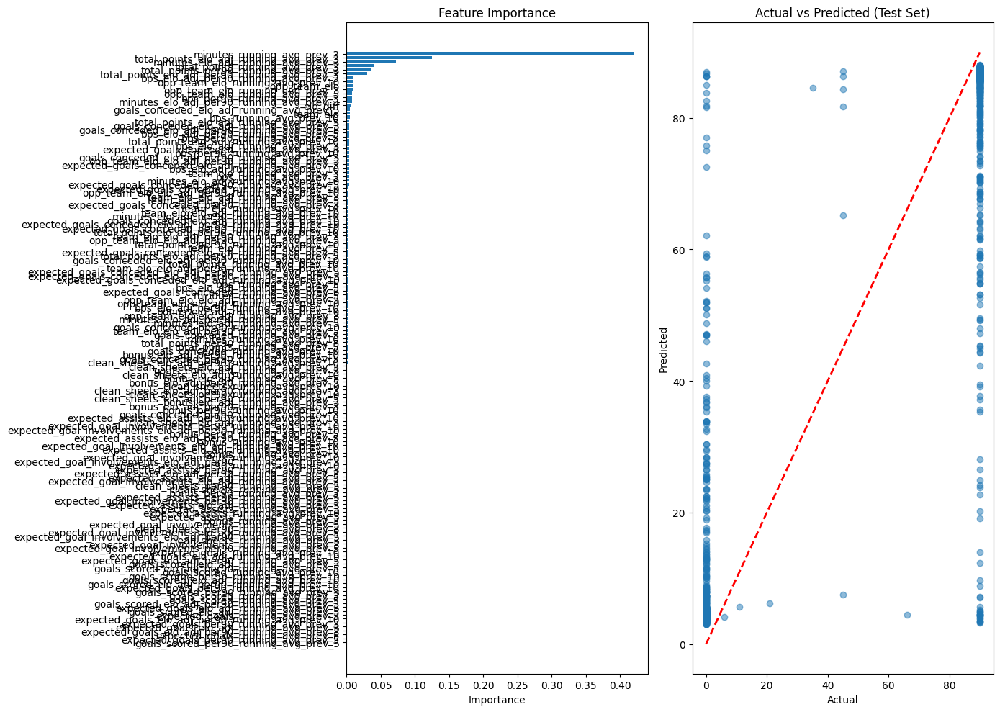

In [10]:
filtered = (df['player_season_minutes_total']>0)#&(df['total_points']<15)#&(df['minutes']>45)

if __name__ == "__main__":
    
    FWD_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols
        )
    FWD_mins_predictor.fit()
    FWD_mins_predictor.plot_results()

    MID_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_mins_predictor.fit()
    MID_mins_predictor.plot_results()

    DEF_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_mins_predictor.fit()
    DEF_mins_predictor.plot_results()

    GK_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_mins_predictor.fit()
    GK_mins_predictor.plot_results()

target=expected_goals_per90, FWD_xG_predictor
Cleaned df size: 2386/4106

Training Set Performance:
R² Score: 0.6173
RMSE: 0.2807
MAE: 0.2133

Test Set Performance:
R² Score: 0.0837
RMSE: 0.4266
MAE: 0.3104

Feature Importance:
                                                     feature  importance
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.069074
                                                    elo_diff    0.066625
                                                opp_team_elo    0.029036
            expected_goals_elo_adj_per90_running_avg_prev_10    0.027736
        expected_goal_involvements_per90_running_avg_prev_10    0.024298
                 expected_goals_conceded_running_avg_prev_10    0.015997
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.014073
              goals_scored_elo_adj_per90_running_avg_prev_10    0.012777
                             opp_team_elo_running_avg_prev_5    0.012624
         expected_goal_involvements_per90_

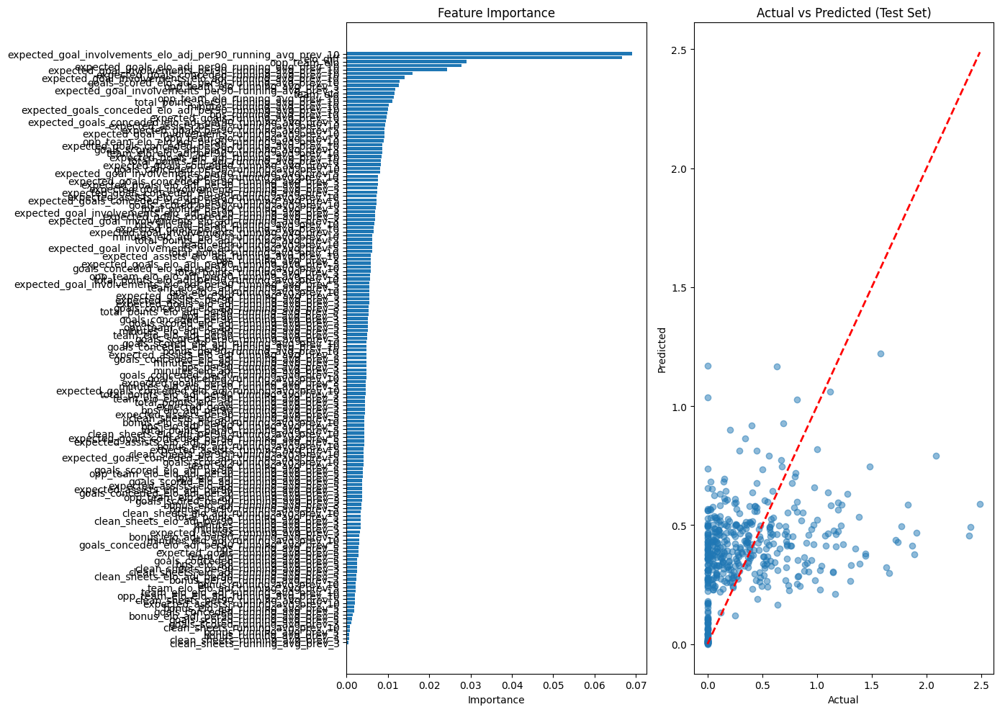

target=expected_goals_per90, MID_xG_predictor
Cleaned df size: 10712/17014

Training Set Performance:
R² Score: 0.5498
RMSE: 0.1729
MAE: 0.1138

Test Set Performance:
R² Score: 0.1038
RMSE: 0.2264
MAE: 0.1419

Feature Importance:
                                                     feature  importance
                          expected_goals_running_avg_prev_10    0.114506
                    expected_goals_per90_running_avg_prev_10    0.063228
                  expected_goals_elo_adj_running_avg_prev_10    0.050366
                                                opp_team_elo    0.038920
            expected_goals_elo_adj_per90_running_avg_prev_10    0.022873
                             opp_team_elo_running_avg_prev_5    0.022098
                                                    elo_diff    0.020741
                             opp_team_elo_running_avg_prev_3    0.015345
        expected_goal_involvements_per90_running_avg_prev_10    0.014560
              expected_goal_involvements

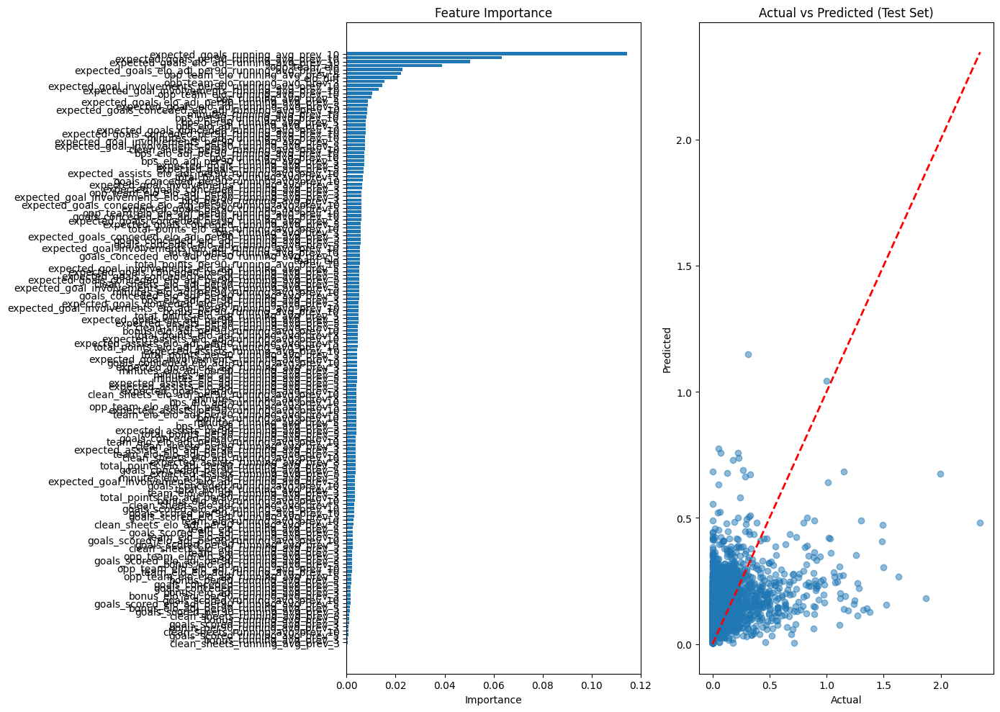

target=expected_goals_per90, DEF_xG_predictor
Cleaned df size: 9211/15009

Training Set Performance:
R² Score: 0.3462
RMSE: 0.0930
MAE: 0.0538

Test Set Performance:
R² Score: -0.0170
RMSE: 0.1212
MAE: 0.0653

Feature Importance:
                                                     feature  importance
                                                opp_team_elo    0.028898
                  expected_goals_elo_adj_running_avg_prev_10    0.028264
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.027617
            expected_goals_elo_adj_per90_running_avg_prev_10    0.026623
                                                    elo_diff    0.025521
                             bps_elo_adj_running_avg_prev_10    0.020955
                 expected_goals_conceded_running_avg_prev_10    0.020818
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.020153
                  goals_conceded_elo_adj_running_avg_prev_10    0.018202
              total_points_elo_adj_per90

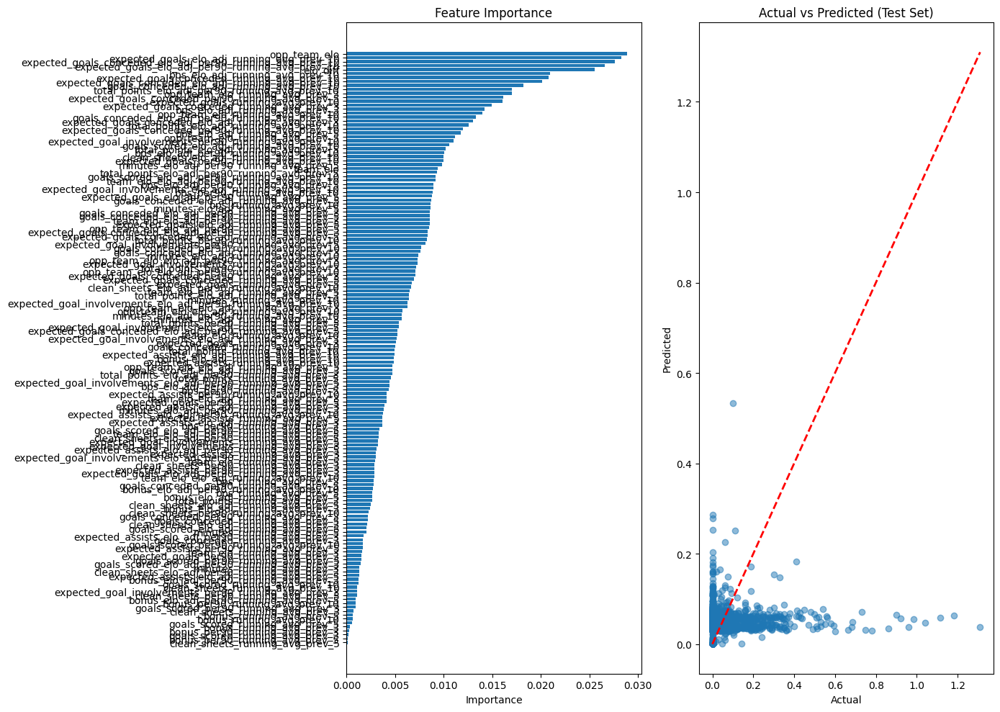

In [11]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_per90, FWD_xG_predictor")
    FWD_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xG_predictor.fit()
    FWD_xG_predictor.plot_results()

    print("target=expected_goals_per90, MID_xG_predictor")
    MID_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xG_predictor.fit()
    MID_xG_predictor.plot_results()
    
    print("target=expected_goals_per90, DEF_xG_predictor")
    DEF_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xG_predictor.fit()
    DEF_xG_predictor.plot_results()

target=expected_assists_per90, FWD_xA_predictor
Cleaned df size: 2386/4106

Training Set Performance:
R² Score: 0.5992
RMSE: 0.0789
MAE: 0.0524

Test Set Performance:
R² Score: -0.0087
RMSE: 0.1250
MAE: 0.0770

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.075204
                 expected_assists_elo_adj_running_avg_prev_3    0.051509
                                                    elo_diff    0.030183
                 expected_assists_elo_adj_running_avg_prev_5    0.027809
                             opp_team_elo_running_avg_prev_3    0.023803
                                                opp_team_elo    0.020008
                        expected_assists_running_avg_prev_10    0.018900
                                bps_per90_running_avg_prev_3    0.015990
          expected_assists_elo_adj_per90_running_avg_prev_10    0.015379
                   goals_conceded_elo_a

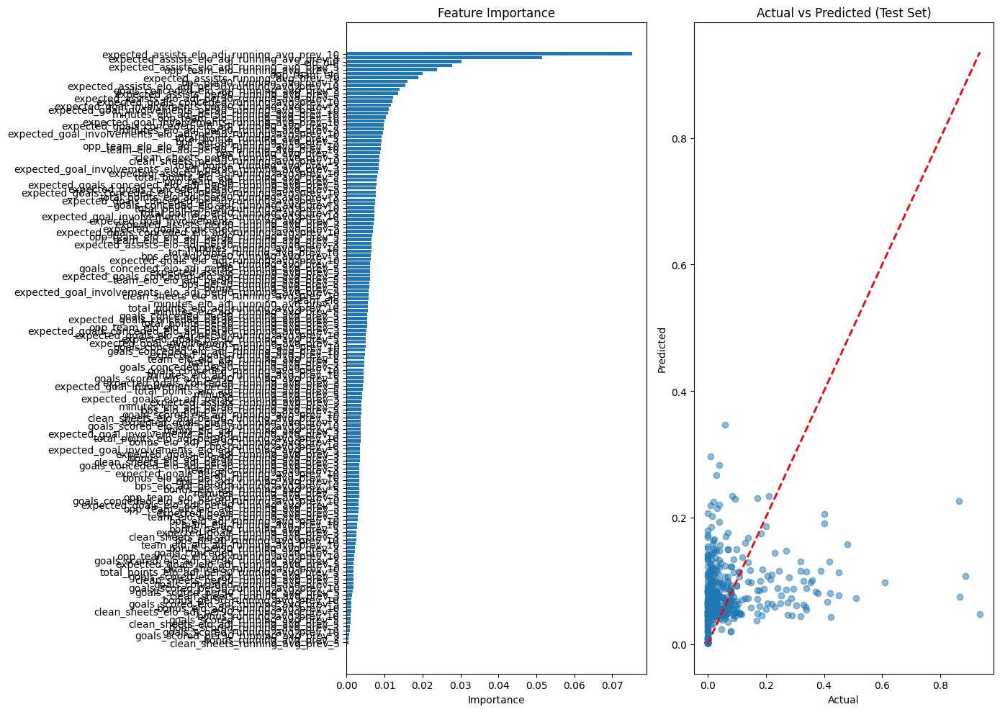

target=expected_assists_per90, MID_xA_predictor
Cleaned df size: 10712/17014

Training Set Performance:
R² Score: 0.4874
RMSE: 0.1167
MAE: 0.0798

Test Set Performance:
R² Score: 0.1373
RMSE: 0.1514
MAE: 0.0974

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.127452
                expected_assists_elo_adj_running_avg_prev_10    0.087722
                                                    elo_diff    0.036821
                                                opp_team_elo    0.032871
                  expected_assists_per90_running_avg_prev_10    0.023611
                        expected_assists_running_avg_prev_10    0.022688
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.018385
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.017678
                            opp_team_elo_running_avg_prev_10    0.012089
                             opp_team_

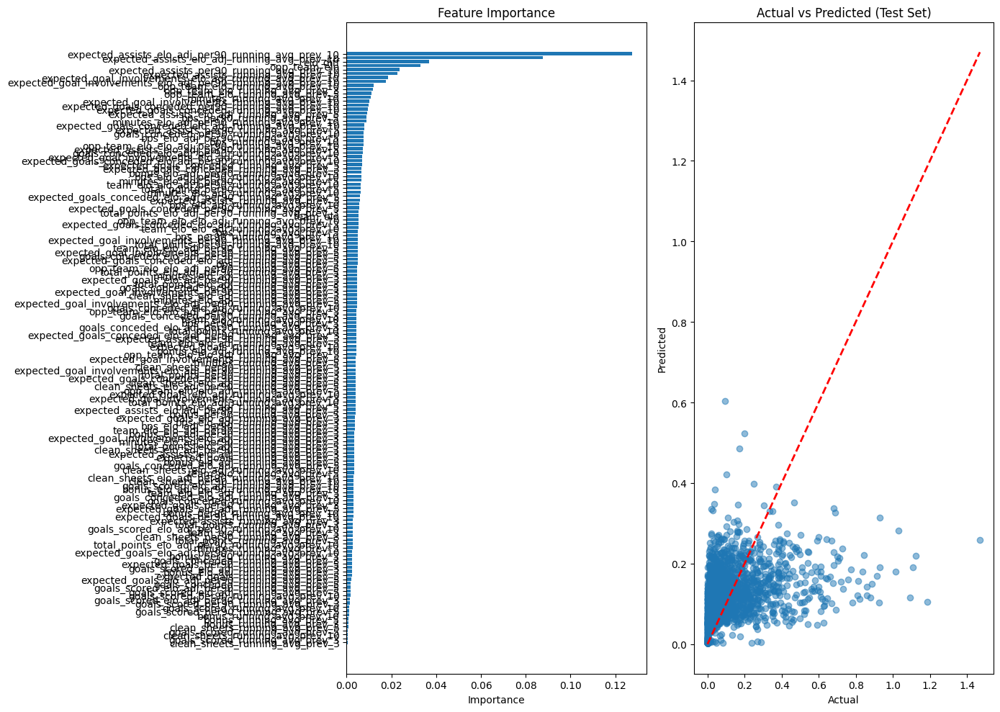

target=expected_assists_per90, DEF_xA_predictor
Cleaned df size: 9211/15009

Training Set Performance:
R² Score: 0.4883
RMSE: 0.0746
MAE: 0.0439

Test Set Performance:
R² Score: 0.0530
RMSE: 0.0996
MAE: 0.0547

Feature Importance:
                                                     feature  importance
                        expected_assists_running_avg_prev_10    0.073804
          expected_assists_elo_adj_per90_running_avg_prev_10    0.071661
                  expected_assists_per90_running_avg_prev_10    0.054411
                                                opp_team_elo    0.034451
                expected_assists_elo_adj_running_avg_prev_10    0.029328
                 expected_assists_elo_adj_running_avg_prev_5    0.025686
           expected_assists_elo_adj_per90_running_avg_prev_5    0.020651
                             opp_team_elo_running_avg_prev_3    0.018782
                            opp_team_elo_running_avg_prev_10    0.016732
         expected_goals_conceded_elo_ad

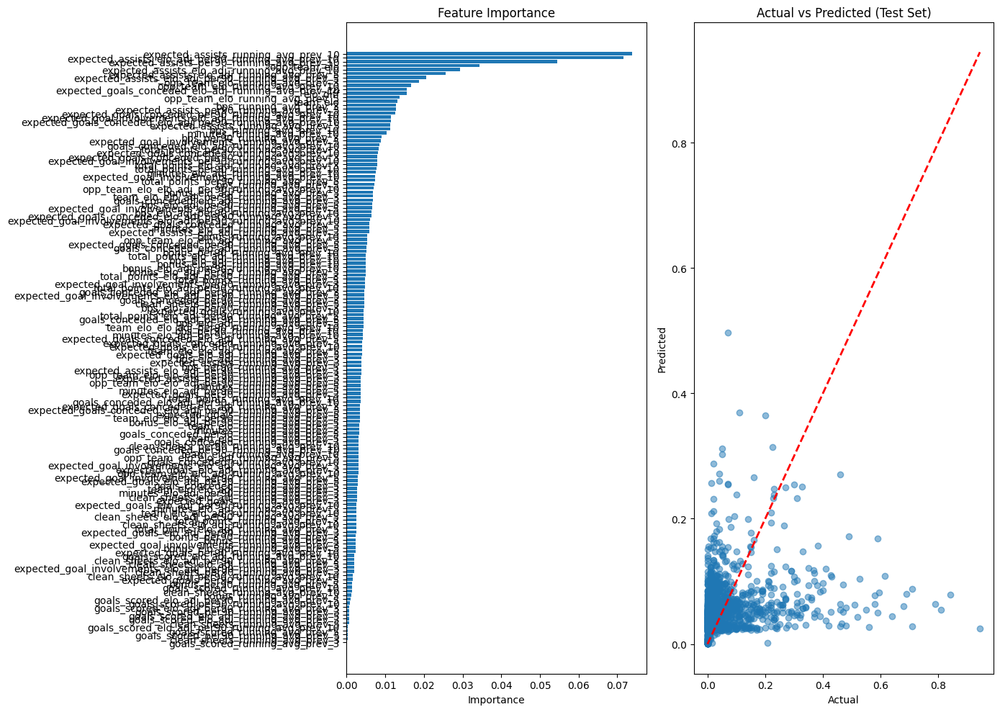

In [12]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_assists_per90, FWD_xA_predictor")
    FWD_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xA_predictor.fit()
    FWD_xA_predictor.plot_results()

    print("target=expected_assists_per90, MID_xA_predictor")
    MID_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xA_predictor.fit()
    MID_xA_predictor.plot_results()
    
    print("target=expected_assists_per90, DEF_xA_predictor")
    DEF_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xA_predictor.fit()
    DEF_xA_predictor.plot_results()

target=expected_goals_conceded_per90, FWD_xGC_predictor
Cleaned df size: 2386/4106

Training Set Performance:
R² Score: 0.7453
RMSE: 0.4709
MAE: 0.3682

Test Set Performance:
R² Score: 0.2848
RMSE: 0.8236
MAE: 0.6096

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.169242
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.115670
           expected_goals_conceded_per90_running_avg_prev_10    0.076480
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.031963
                 expected_goals_conceded_running_avg_prev_10    0.028660
                                                opp_team_elo    0.017539
                            opp_team_elo_running_avg_prev_10    0.015398
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.015283
                             opp_team_elo_running_avg_prev_5    0.012295
                    expected_goa

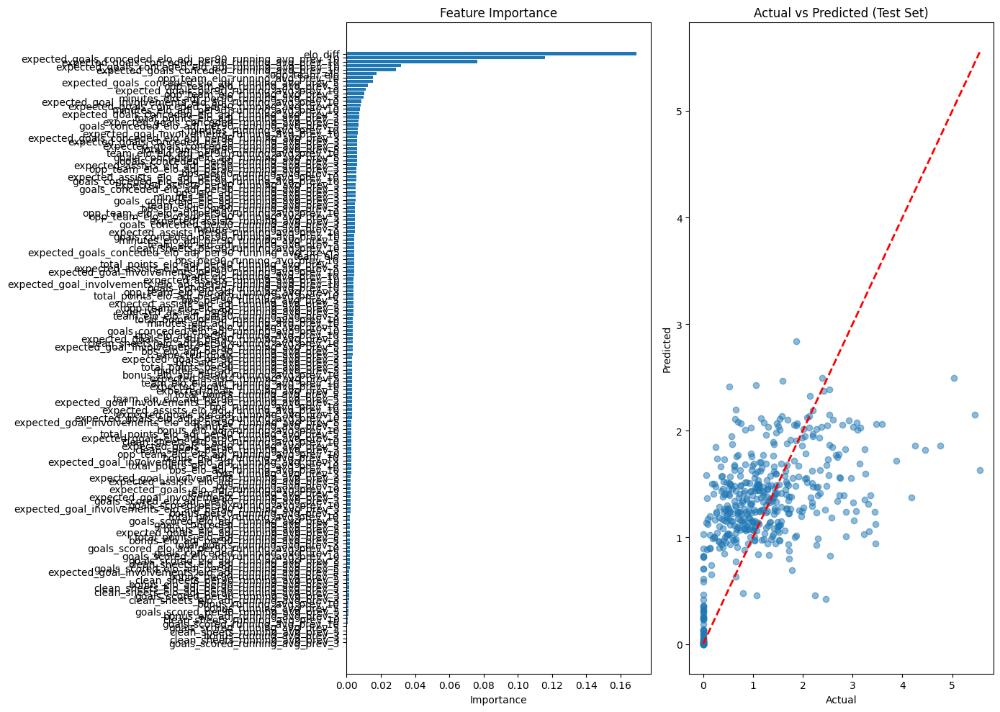

target=expected_goals_conceded_per90, MID_xGC_predictor
Cleaned df size: 10712/17014

Training Set Performance:
R² Score: 0.6293
RMSE: 0.5767
MAE: 0.4362

Test Set Performance:
R² Score: 0.4675
RMSE: 0.7067
MAE: 0.5329

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.245605
           expected_goals_conceded_per90_running_avg_prev_10    0.154681
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.054034
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.043143
                 expected_goals_conceded_running_avg_prev_10    0.038291
                                                opp_team_elo    0.024207
                             opp_team_elo_running_avg_prev_5    0.021904
                            opp_team_elo_running_avg_prev_10    0.020977
                             opp_team_elo_running_avg_prev_3    0.019681
expected_goal_involvements_elo

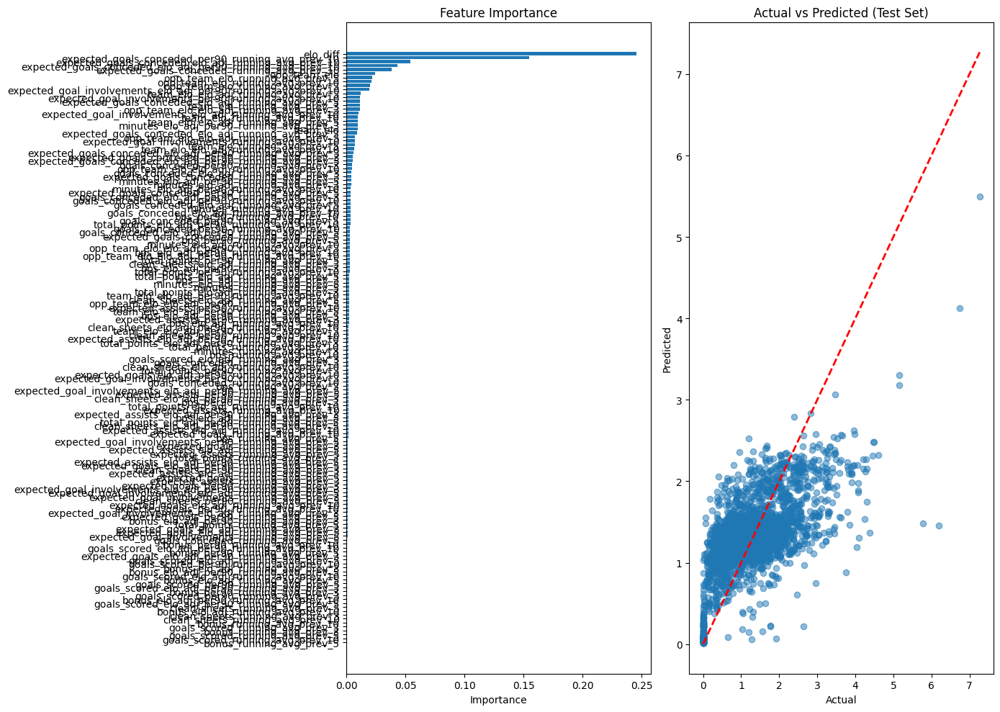

target=expected_goals_conceded_per90, DEF_xGC_predictor
Cleaned df size: 9211/15009

Training Set Performance:
R² Score: 0.6527
RMSE: 0.5645
MAE: 0.4240

Test Set Performance:
R² Score: 0.4493
RMSE: 0.6885
MAE: 0.5174

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.224465
           expected_goals_conceded_per90_running_avg_prev_10    0.133342
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.084907
                 expected_goals_conceded_running_avg_prev_10    0.070397
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.031607
                                                opp_team_elo    0.023145
                             opp_team_elo_running_avg_prev_5    0.021132
                            opp_team_elo_running_avg_prev_10    0.021019
                             opp_team_elo_running_avg_prev_3    0.017271
                               

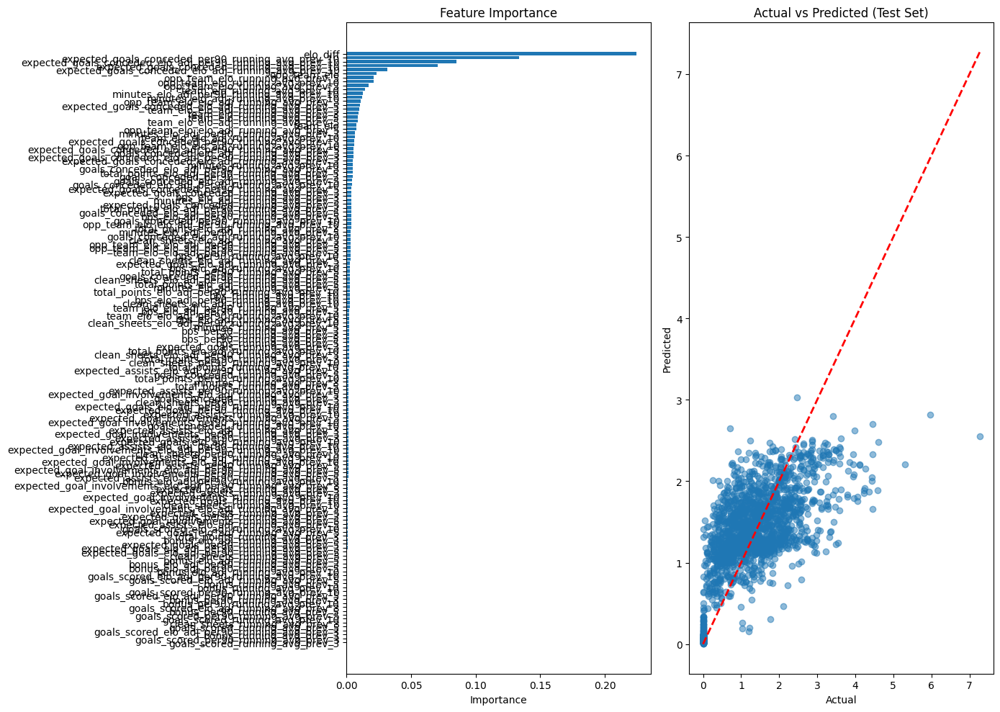

target=expected_goals_conceded_per90, GK_xGC_predictor
Cleaned df size: 2284/3666

Training Set Performance:
R² Score: 0.7221
RMSE: 0.4866
MAE: 0.3754

Test Set Performance:
R² Score: 0.3689
RMSE: 0.7423
MAE: 0.5555

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.203230
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.109000
           expected_goals_conceded_per90_running_avg_prev_10    0.093942
                 expected_goals_conceded_running_avg_prev_10    0.032365
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.029263
                                                opp_team_elo    0.028315
                   goals_conceded_elo_adj_running_avg_prev_5    0.018569
                            opp_team_elo_running_avg_prev_10    0.016976
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.016092
                             opp_

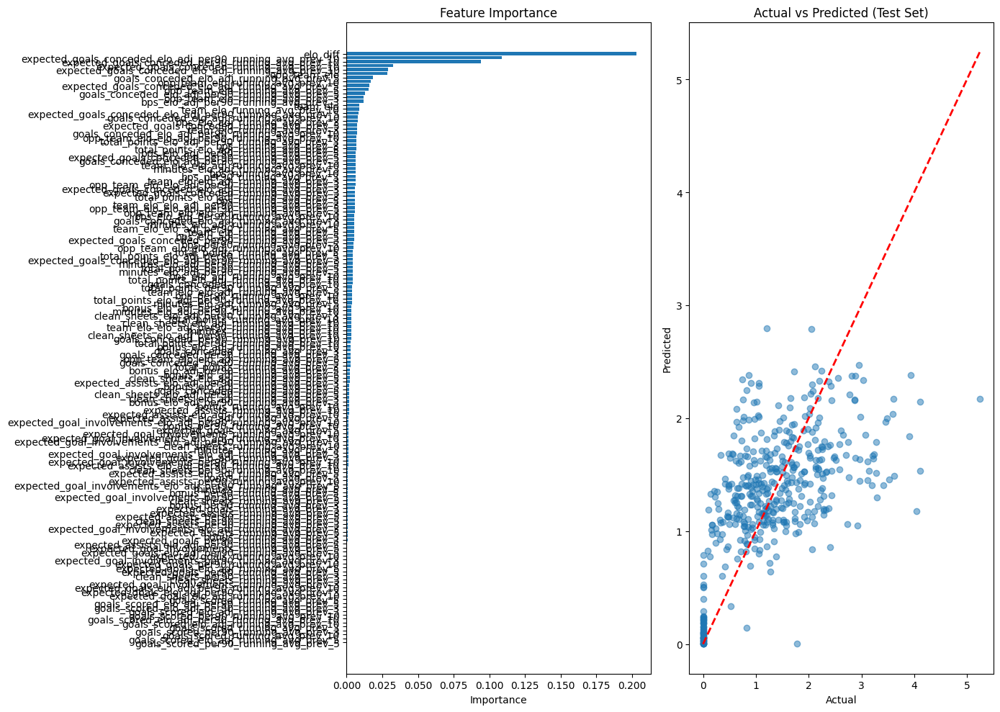

In [13]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_conceded_per90, FWD_xGC_predictor")
    FWD_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xGC_predictor.fit()
    FWD_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, MID_xGC_predictor")
    MID_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xGC_predictor.fit()
    MID_xGC_predictor.plot_results()
    
    print("target=expected_goals_conceded_per90, DEF_xGC_predictor")
    DEF_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xGC_predictor.fit()
    DEF_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, GK_xGC_predictor")
    GK_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_xGC_predictor.fit()
    GK_xGC_predictor.plot_results()

target=bps_per90, FWD_bps_predictor
Cleaned df size: 2386/4106

Training Set Performance:
R² Score: 0.5961
RMSE: 12.2820
MAE: 10.0433

Test Set Performance:
R² Score: -0.0000
RMSE: 19.3702
MAE: 15.4084

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.057290
                                                opp_team_elo    0.025612
                            opp_team_elo_running_avg_prev_10    0.024747
                             opp_team_elo_running_avg_prev_3    0.019356
                    minutes_elo_adj_per90_running_avg_prev_3    0.016631
                             opp_team_elo_running_avg_prev_5    0.014845
                    minutes_elo_adj_per90_running_avg_prev_5    0.014330
              total_points_elo_adj_per90_running_avg_prev_10    0.012774
              clean_sheets_elo_adj_per90_running_avg_prev_10    0.011864
                             bps_elo_adj_runnin

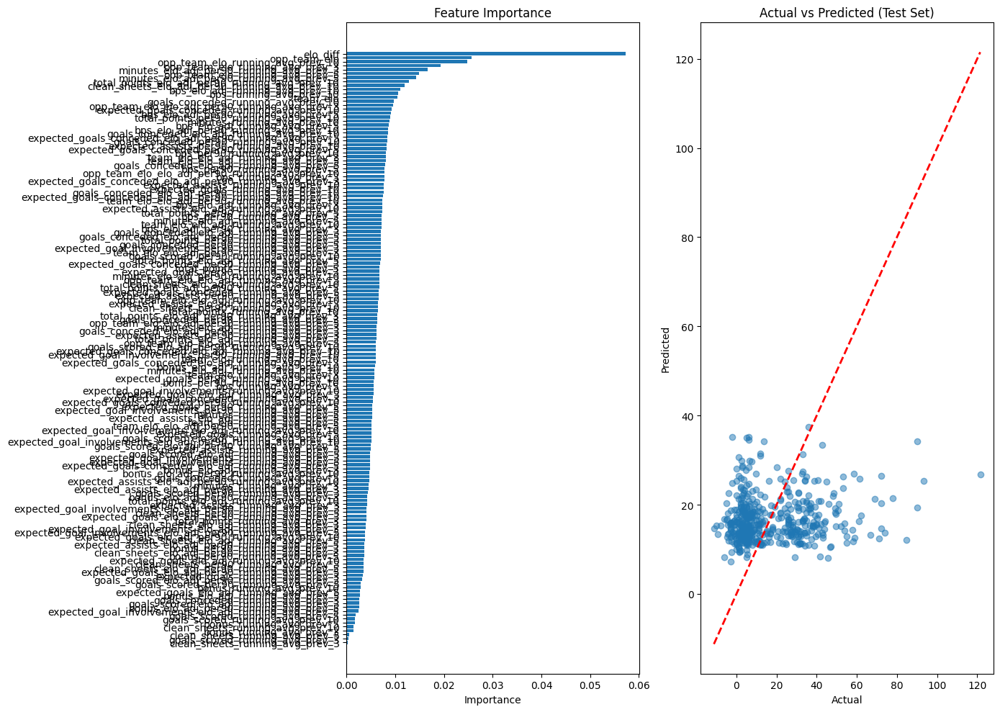

target=bps_per90, MID_bps_predictor
Cleaned df size: 10712/17014

Training Set Performance:
R² Score: 0.3924
RMSE: 9.0916
MAE: 6.9968

Test Set Performance:
R² Score: 0.0390
RMSE: 11.6039
MAE: 8.4315

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.093538
                expected_assists_elo_adj_running_avg_prev_10    0.045474
                                                opp_team_elo    0.023570
                            opp_team_elo_running_avg_prev_10    0.018975
                             opp_team_elo_running_avg_prev_5    0.018747
                             opp_team_elo_running_avg_prev_3    0.018611
                               bps_per90_running_avg_prev_10    0.017087
                                     bps_running_avg_prev_10    0.015741
                        expected_assists_running_avg_prev_10    0.015452
          expected_assists_elo_adj_per90_running_

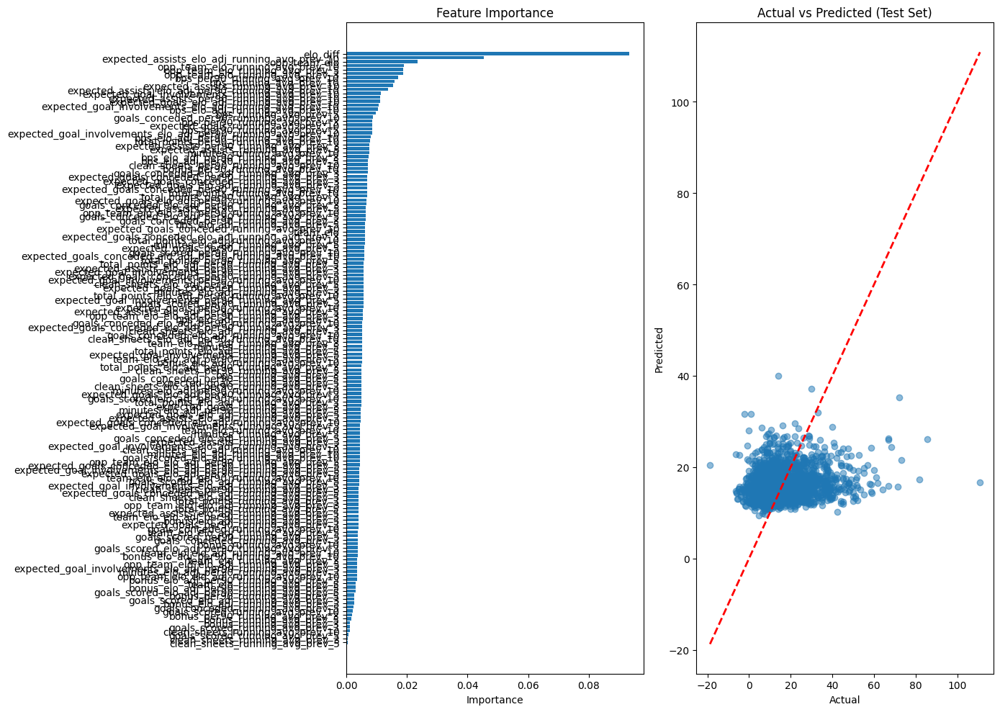

target=bps_per90, DEF_bps_predictor
Cleaned df size: 9211/15009

Training Set Performance:
R² Score: 0.4796
RMSE: 7.4353
MAE: 5.9622

Test Set Performance:
R² Score: 0.1520
RMSE: 8.9005
MAE: 7.0409

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.192740
                                                opp_team_elo    0.032305
                             opp_team_elo_running_avg_prev_5    0.022994
                            opp_team_elo_running_avg_prev_10    0.019602
                             opp_team_elo_running_avg_prev_3    0.019365
                               bps_per90_running_avg_prev_10    0.019337
                                team_elo_running_avg_prev_10    0.016648
                                bps_per90_running_avg_prev_5    0.014780
                                                    team_elo    0.013501
                                 team_elo_running_a

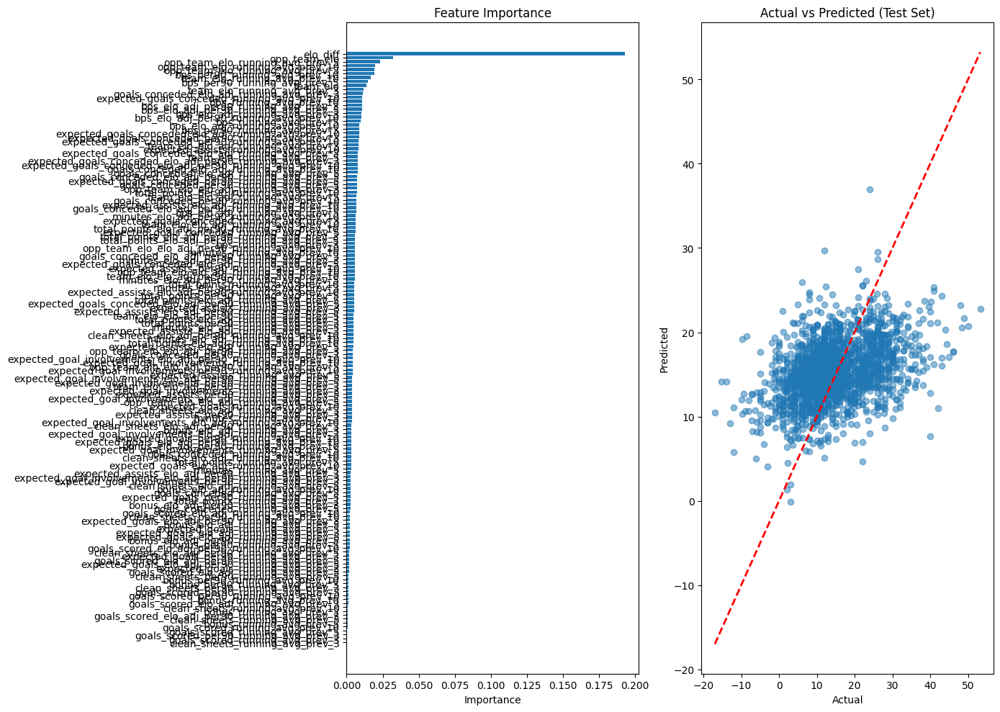

target=bps_per90, GK_bps_predictor
Cleaned df size: 2284/3666

Training Set Performance:
R² Score: 0.6587
RMSE: 5.3275
MAE: 4.3782

Test Set Performance:
R² Score: 0.0458
RMSE: 9.4182
MAE: 7.6176

Feature Importance:
                                                     feature  importance
                            opp_team_elo_running_avg_prev_10    0.042212
                                                opp_team_elo    0.037338
                             opp_team_elo_running_avg_prev_3    0.031303
                               bps_per90_running_avg_prev_10    0.030142
                                                    elo_diff    0.029949
                             opp_team_elo_running_avg_prev_5    0.026182
                                     bps_running_avg_prev_10    0.018884
    expected_goals_conceded_elo_adj_per90_running_avg_prev_3    0.017567
           expected_goals_conceded_per90_running_avg_prev_10    0.017566
                             bps_elo_adj_running_avg_

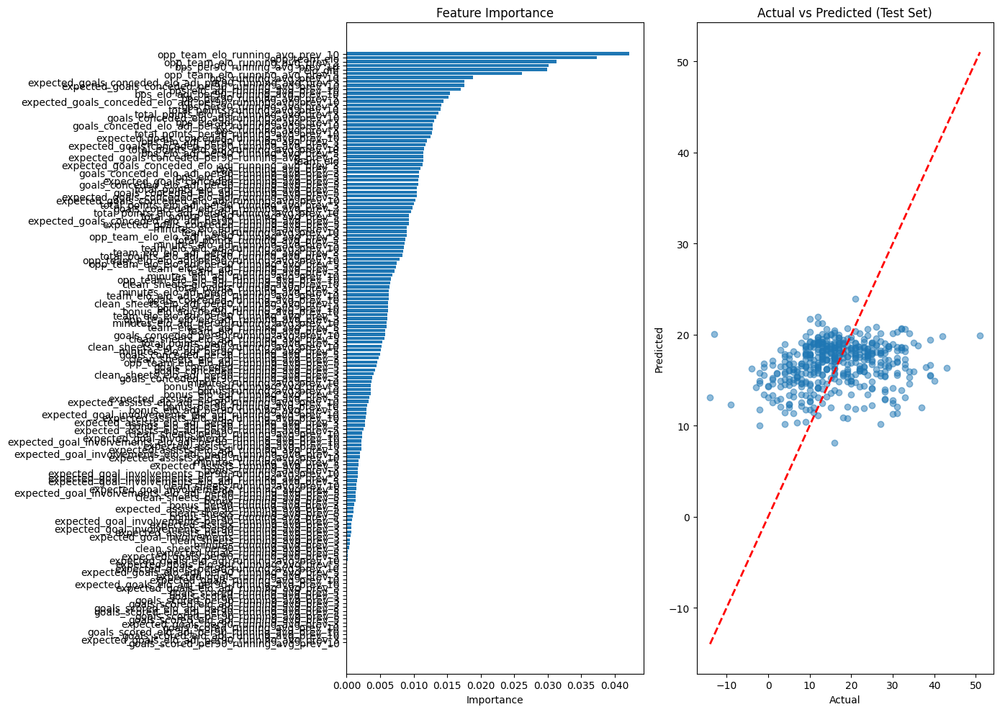

In [14]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=bps_per90, FWD_bps_predictor")
    FWD_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90', # try: 'bonus_per90'
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_bps_predictor.fit()
    FWD_bps_predictor.plot_results()

    print("target=bps_per90, MID_bps_predictor")
    MID_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_bps_predictor.fit()
    MID_bps_predictor.plot_results()
    
    print("target=bps_per90, DEF_bps_predictor")
    DEF_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_bps_predictor.fit()
    DEF_bps_predictor.plot_results()

    print("target=bps_per90, GK_bps_predictor")
    GK_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_bps_predictor.fit()
    GK_bps_predictor.plot_results()

target=saves_per90, GK_saves_predictor
Cleaned df size: 219/3821

Training Set Performance:
R² Score: 0.8521
RMSE: 0.6276
MAE: 0.4958

Test Set Performance:
R² Score: 0.0981
RMSE: 1.9009
MAE: 1.3757

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.049347
                                                opp_team_elo    0.036151
                            opp_team_elo_running_avg_prev_10    0.033467
                                recoveries_per90_alltime_avg    0.026484
                             opp_team_elo_running_avg_prev_3    0.022466
                                team_elo_running_avg_prev_10    0.022282
                             opp_team_elo_running_avg_prev_5    0.021283
                                 team_elo_running_avg_prev_5    0.020842
                                       cbi_per90_alltime_avg    0.020247
                               cbi_per90_running_a

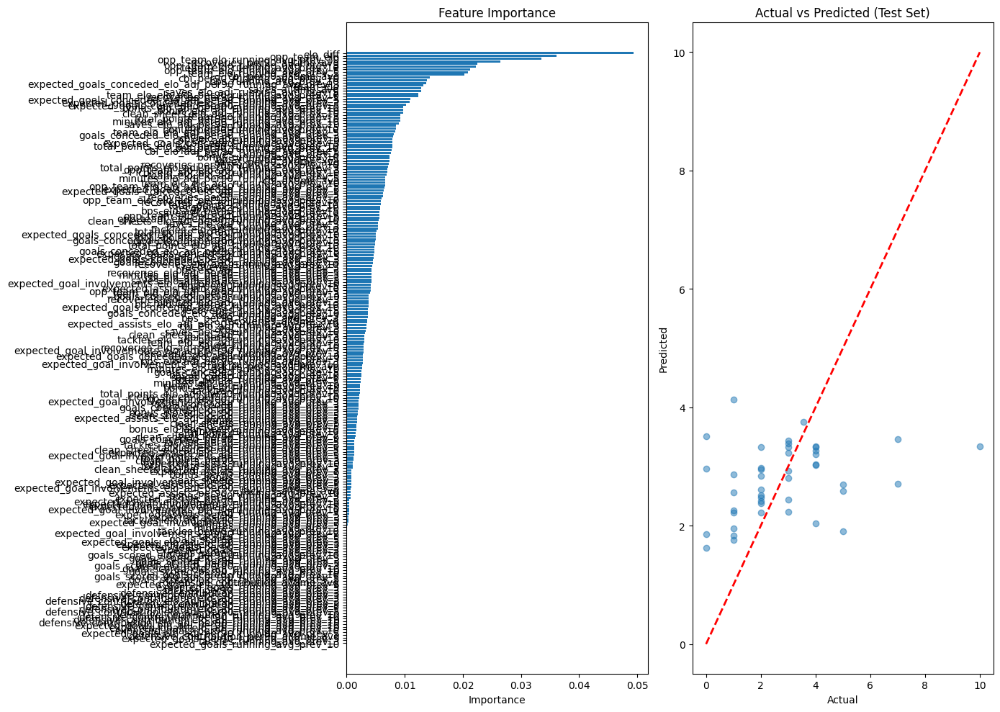

In [15]:
#shots saved
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>0)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=saves_per90, GK_saves_predictor")
    GK_saves_predictor = FPLPredictor(
    data=df[filtered],
    target='saves_per90',
    positions={'GK'})
    GK_saves_predictor.fit()
    GK_saves_predictor.plot_results()

target=defensive_contribution_per90, FWD_defcon_predictor
Cleaned df size: 239/4712

Training Set Performance:
R² Score: 0.8426
RMSE: 1.0690
MAE: 0.8113

Test Set Performance:
R² Score: -0.1520
RMSE: 3.3889
MAE: 2.4218

Feature Importance:
                                                     feature  importance
                   defensive_contribution_running_avg_prev_3    0.026517
                 expected_assists_elo_adj_running_avg_prev_3    0.026326
                         expected_assists_running_avg_prev_3    0.022582
                             opp_team_elo_running_avg_prev_5    0.021910
                                                    team_elo    0.019178
                                team_elo_running_avg_prev_10    0.018189
           defensive_contribution_elo_adj_running_avg_prev_3    0.017697
                                 team_elo_running_avg_prev_3    0.014975
                  expected_goals_conceded_running_avg_prev_3    0.013876
                         recov

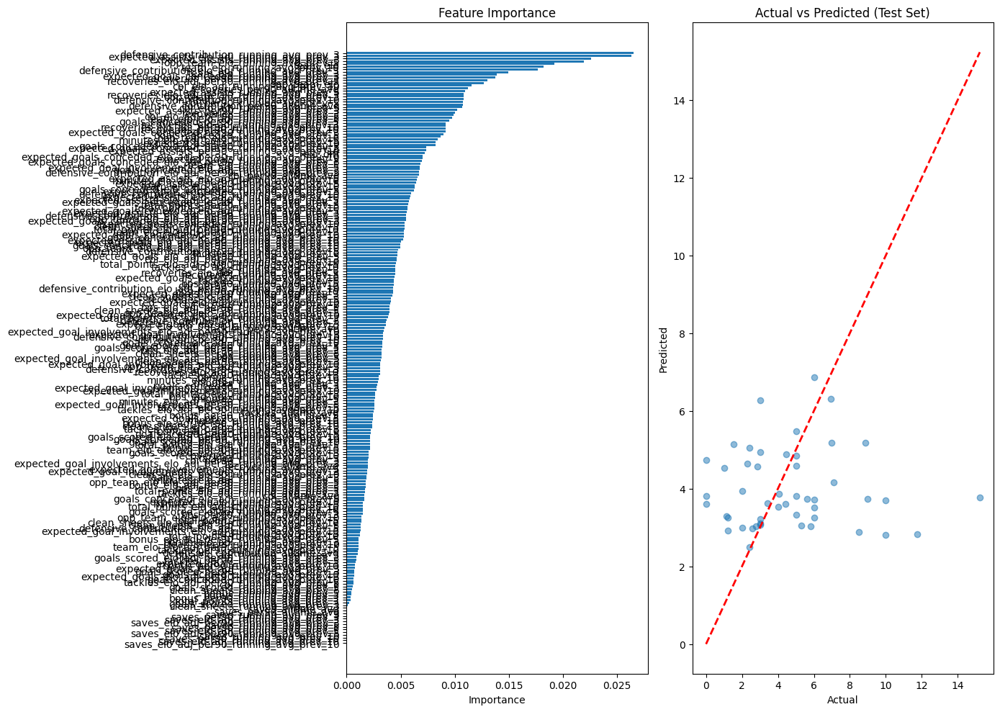

target=defensive_contribution_per90, MID_defcon_predictor
Cleaned df size: 1143/19406

Training Set Performance:
R² Score: 0.8240
RMSE: 1.6797
MAE: 1.3484

Test Set Performance:
R² Score: 0.0775
RMSE: 3.8464
MAE: 3.0363

Feature Importance:
                                                     feature  importance
                                 tackles_running_avg_prev_10    0.043831
                           tackles_per90_running_avg_prev_10    0.032504
                                         tackles_alltime_avg    0.030976
                   defensive_contribution_running_avg_prev_5    0.017358
            defensive_contribution_per90_running_avg_prev_10    0.014445
                      total_points_per90_running_avg_prev_10    0.013905
        expected_goal_involvements_per90_running_avg_prev_10    0.013652
                    expected_goals_per90_running_avg_prev_10    0.012891
                                                opp_team_elo    0.012204
expected_goal_involvements_el

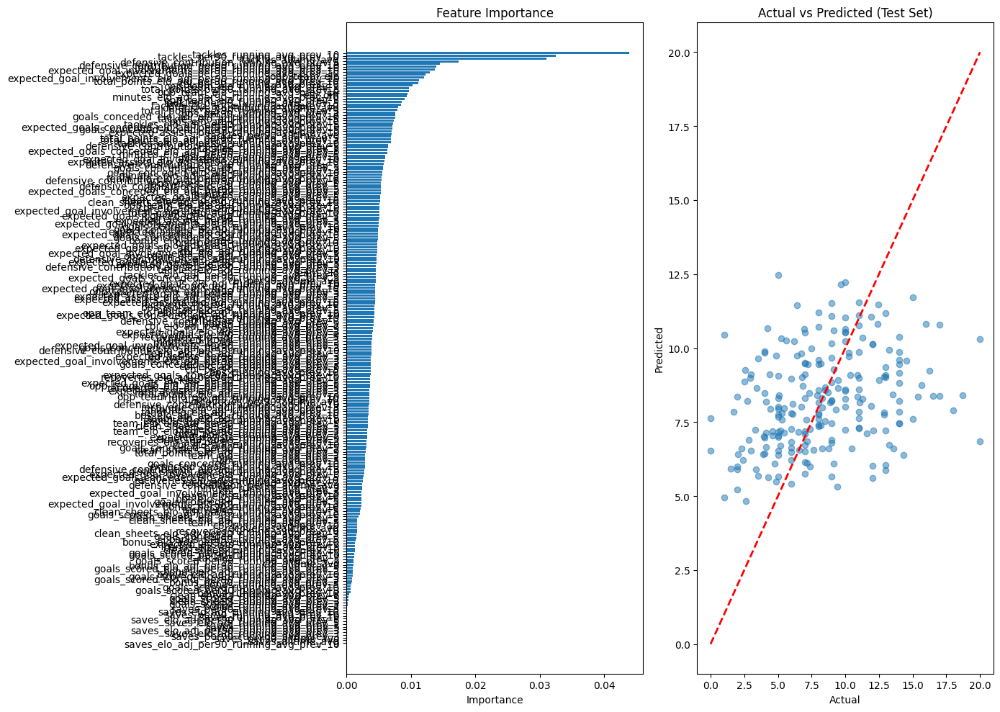

target=defensive_contribution_per90, DEF_defcon_predictor
Cleaned df size: 945/16405

Training Set Performance:
R² Score: 0.7944
RMSE: 1.7522
MAE: 1.4113

Test Set Performance:
R² Score: 0.0464
RMSE: 3.5021
MAE: 2.7153

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.045796
                                                    elo_diff    0.039148
                                                opp_team_elo    0.024871
               opp_team_elo_elo_adj_per90_running_avg_prev_5    0.021910
                                       cbi_per90_alltime_avg    0.020049
                             opp_team_elo_running_avg_prev_3    0.016921
                                cbi_per90_running_avg_prev_3    0.014614
                                     cbi_running_avg_prev_10    0.014201
                            opp_team_elo_running_avg_prev_10    0.012946
         expected_goals_conced

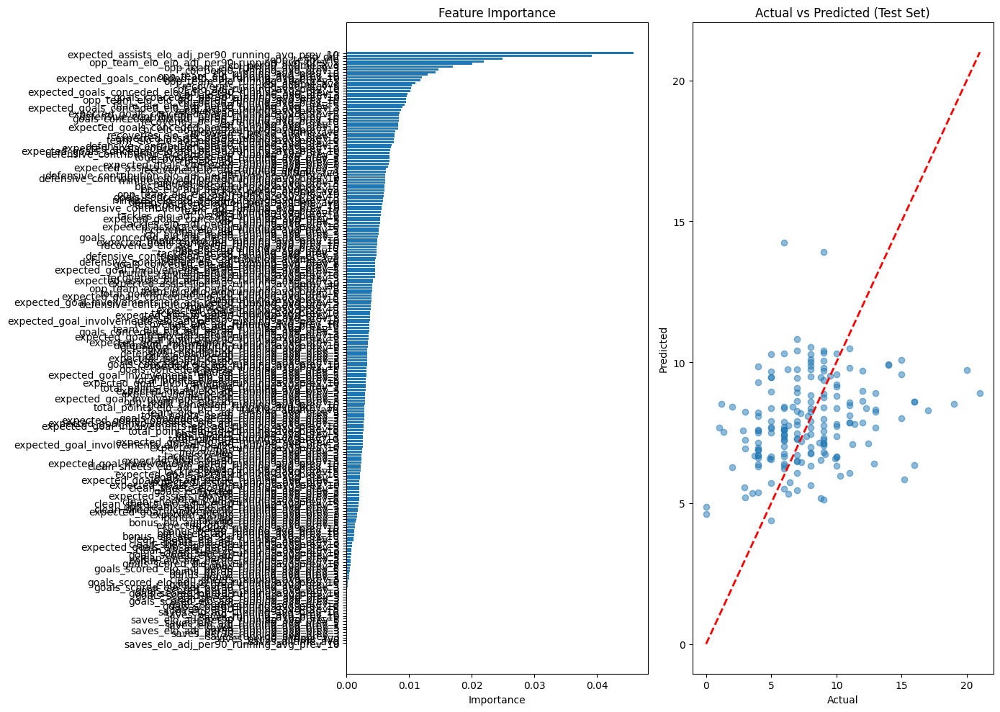

In [16]:
# >10 defcon (CBIT) for a defender
# >12 defcon (CBIT+R) for mid or fwd
filtered = (df['minutes']>30)&(df['player_season_minutes_total']>0)

if __name__ == "__main__":
    
    print("target=defensive_contribution_per90, FWD_defcon_predictor")
    FWD_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'FWD'})
    FWD_defcon_predictor.fit()
    FWD_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, MID_defcon_predictor")
    MID_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'MID'})
    MID_defcon_predictor.fit()
    MID_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, DEF_defcon_predictor")
    DEF_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'DEF'})
    DEF_defcon_predictor.fit()
    DEF_defcon_predictor.plot_results()

Goals conceded per 90
Estimated λ (mean goals per match): 1.341


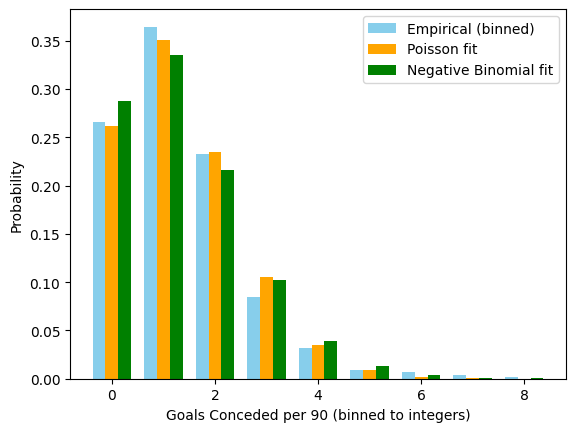

Mean: 1.334, Variance: 1.526
Overdispersion ratio (Var/Mean): 1.144
✅ Poisson assumption looks reasonable.
P(X < 1 goal) = 0.261


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Goals conceded per 90")

# Compute xGC per 90
df['xgc_p90'] = (df['expected_goals_conceded'] / df['minutes']) * 90

# Filter to reasonable samples
data = df[(df['minutes'] > 0) & (df['xgc_p90'] < 8)]['xgc_p90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean goals per match): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Goals Conceded per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")

# --- Example probability ---
p_less_than_1 = poisson.cdf(0, mu=lambda_hat)
print(f"P(X < 1 goal) = {p_less_than_1:.3f}")


Mids & Forwards
Estimated λ (mean defcon per 90): 8.239


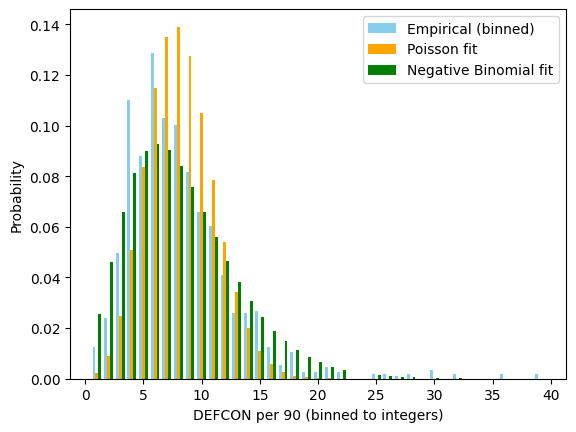

Mean: 8.234, Variance: 22.524
Overdispersion ratio (Var/Mean): 2.736
⚠️ Likely overdispersed → Negative Binomial may fit better.


In [18]:
#Test if defcon_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Mids & Forwards")

# Filter to reasonable samples
data = df[(df['minutes'] > 0)
          & (df['defensive_contribution_per90'] > 0) 
          & (df['defensive_contribution_per90'] < 40)
          & (df['position'].isin(['DEF']))]['defensive_contribution_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('DEFCON per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


GK saves per 90
Estimated λ (mean defcon per 90): 3.218


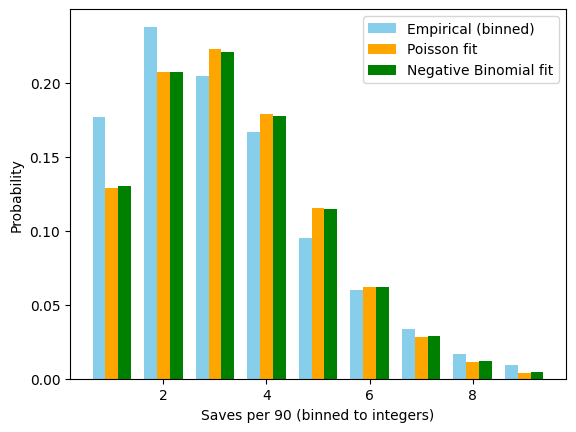

Mean: 3.218, Variance: 3.269
Overdispersion ratio (Var/Mean): 1.016
✅ Poisson assumption looks reasonable.


In [19]:
#Test if saves_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("GK saves per 90")

# Filter to reasonable samples
data = df[#(df['minutes'] > 0)
          (df['saves_per90'] > 0) 
          & (df['saves_per90'] < 10)
          & (df['position'].isin(['GK']))]['saves_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Saves per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


                                 OLS Regression Results                                
Dep. Variable:                  bonus   R-squared (uncentered):                   0.446
Model:                            OLS   Adj. R-squared (uncentered):              0.446
Method:                 Least Squares   F-statistic:                          3.196e+04
Date:                Wed, 26 Nov 2025   Prob (F-statistic):                        0.00
Time:                        15:21:29   Log-Likelihood:                         -37376.
No. Observations:               39644   AIC:                                  7.475e+04
Df Residuals:                   39643   BIC:                                  7.476e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

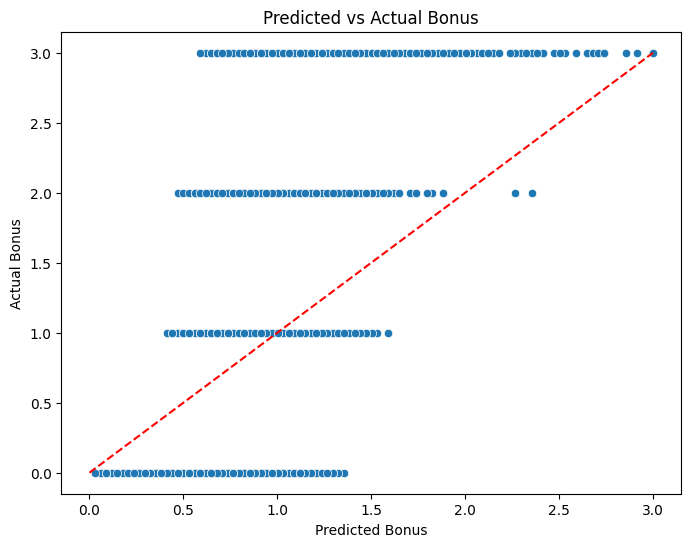

Actual Bonus       0.0       1.0       2.0       3.0
Position                                            
DEF           0.459396  0.232666  1.109234  1.952000
FWD           0.332582  0.200810  1.049930  1.711028
GK            0.491998  0.246825  1.116993  2.014035
GKP                NaN       NaN       NaN       NaN
MID           0.393904  0.247492  1.052691  1.828146


In [20]:
# Generalize the relationship between bps & bonus points
import statsmodels.formula.api as smf
filtered = (df['minutes']>45) & (df['bonus']>=0) & (df['bps']>0) & (df['position'].isin(['GK','DEF','MID','FWD']))
# df['bonus_sq'] = df['bonus']**2

model = smf.ols('bonus ~ bps -1', data=df[filtered]).fit()
print(model.summary())

df['bonus_pred'] = model.predict(df[filtered])
df['bonus_pred'] = np.clip(df['bonus_pred'], 0, 3) # clip prediction to 3

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x='bonus_pred', y='bonus', data=df)
plt.plot([df['bonus'].min(), df['bonus'].max()],
         [df['bonus'].min(), df['bonus'].max()],
         color='red', linestyle='--')  # 45-degree line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs Actual Bonus')
plt.show()

import pandas as pd
import numpy as np

# Function to calculate RMSE
def rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Group by position and actual bonus, then calculate RMSE
rmse_table = df.groupby(['position', 'bonus']).apply(lambda x: rmse(x['bonus'], x['bonus_pred']))

# Convert to DataFrame
rmse_table = rmse_table.reset_index()
rmse_table.columns = ['Position', 'Actual Bonus', 'RMSE']

pivot_rmse = rmse_table.pivot(index='Position', columns='Actual Bonus', values='RMSE')
print(pivot_rmse)


In [21]:
prediction_data = df[(df['season']==20252026)
                     &(df['event']>=stats_current_gameweek+1)]

In [22]:
prediction_data.pivot_table(index='event',values='minutes',aggfunc='count')

,minutes
event,
13.0,0
14.0,0
15.0,0
16.0,0
17.0,0
18.0,0
19.0,0
20.0,0
21.0,0


In [23]:
def predict_target_vectorized(df, model_dict, col_name):
    preds = []
    
    for pos, model in model_dict.items():
        subset = df[df['position'] == pos]
        if not subset.empty:
            pos_preds = model.predict_new(subset)
            temp = subset.copy()
            temp[col_name] = pos_preds
            preds.append(temp)
    
    if not preds:
        # If no positions matched at all
        return pd.Series(index=df.index, dtype=float)
    
    result = pd.concat(preds)
    
    # Safely align back to original DataFrame
    output = pd.Series(index=df.index, dtype=float)
    output.loc[result.index] = result[col_name]
    return output

In [24]:
target_col_name = 'mins_pred'
mins_model_dict = {'FWD': FWD_mins_predictor, 'MID': MID_mins_predictor, 'DEF': DEF_mins_predictor, 'GK': GK_mins_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_8220\2521843321.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)


count    11752.000000
mean        43.061832
std         29.822386
min          1.190106
25%         14.014717
50%         42.734122
75%         74.894865
max         88.023060
Name: mins_pred, dtype: float64

In [25]:
target_col_name = 'xgp90_pred'
xg_model_dict = {'FWD': FWD_xG_predictor, 'MID': MID_xG_predictor, 'DEF': DEF_xG_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_8220\365369552.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)


count    10998.000000
mean         0.139750
std          0.128331
min          0.006597
25%          0.049982
50%          0.088098
75%          0.187415
max          1.301504
Name: xgp90_pred, dtype: float64

In [26]:
target_col_name = 'xap90_pred'
xA_model_dict = {'FWD': FWD_xA_predictor, 'MID': MID_xA_predictor, 'DEF': DEF_xA_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_8220\4144355699.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)


count    10998.000000
mean         0.085029
std          0.050271
min          0.007350
25%          0.047056
50%          0.073868
75%          0.112785
max          0.302742
Name: xap90_pred, dtype: float64

In [27]:
target_col_name = 'xgcp90_pred'
xGC_model_dict = {'FWD': FWD_xGC_predictor, 'MID': MID_xGC_predictor, 'DEF': DEF_xGC_predictor, 'GK':GK_xGC_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_8220\682035545.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)


count    11752.000000
mean         1.430269
std          0.386137
min          0.335660
25%          1.176188
50%          1.370449
75%          1.677426
max          2.712778
Name: xgcp90_pred, dtype: float64

In [28]:
target_col_name = 'xbpsp90_pred'
bps_model_dict = {'FWD': FWD_bps_predictor, 'MID': MID_bps_predictor, 'DEF': DEF_bps_predictor, 'GK':GK_bps_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_8220\3051138591.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)


count    11752.000000
mean        15.366388
std          3.357545
min          4.293355
25%         13.170976
50%         15.139724
75%         17.224472
max         38.092050
Name: xbpsp90_pred, dtype: float64

In [29]:
target_col_name = 'xsavesp90_pred'
saves_model_dict = {'GK':GK_saves_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_8220\803536942.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)


count    754.000000
mean       2.692785
std        0.475645
min        1.334553
25%        2.331457
50%        2.712473
75%        3.027781
max        3.880804
Name: xsavesp90_pred, dtype: float64

In [30]:
target_col_name = 'xdefconp90_pred'
defcon_model_dict = {'FWD': FWD_defcon_predictor, 'MID': MID_defcon_predictor, 'DEF': DEF_defcon_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_8220\2777375241.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)


count    10998.000000
mean         7.582807
std          2.068889
min          2.427175
25%          6.474696
50%          7.720647
75%          8.929640
max         15.845482
Name: xdefconp90_pred, dtype: float64

In [31]:
prediction_data[prediction_data['position']=='MID'].head()[["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]]

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
129658,Ben Winterburn,96.0,45.0,Bournemouth,MID,20252026.0,31.0,Man Utd,1045.971106,1.695404,0.185880,0.042306,1.309338
129750,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,22.0,Chelsea,1144.719414,1.675466,0.145943,0.057986,1.045158
129827,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,23.0,Nott'm Forest,1034.981739,1.675466,0.140499,0.055552,1.021456
129880,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,13.0,Man Utd,1045.971106,52.740385,0.065727,0.192922,1.254846
129882,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,14.0,Burnley,895.747010,52.554629,0.091853,0.237674,0.956766


In [32]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>0)
    ][["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]].sort_values(by='xgp90_pred',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
134296,Erling Haaland,430.0,149.0,Man City,FWD,20252026.0,13.0,Leeds,918.161783,67.915598,1.277471,0.085345,1.241310
146054,Viktor Gyökeres,666.0,88.0,Arsenal,FWD,20252026.0,13.0,Chelsea,1144.719414,48.046243,0.597621,0.104889,1.170808
132132,Charalampos Kostoulas,181.0,48.0,Brighton,FWD,20252026.0,13.0,Nott'm Forest,1034.981739,10.252165,0.579829,0.057067,1.292445
134133,Enes Ünal,98.0,54.0,Bournemouth,FWD,20252026.0,13.0,Sunderland,1030.901187,12.697479,0.557772,0.204684,0.579101
136086,Igor Thiago Nascimento Rodrigues,136.0,64.0,Brentford,FWD,20252026.0,13.0,Burnley,895.747010,81.533621,0.536974,0.065079,1.218463
133769,Eddie Nketiah,284.0,54.0,Crystal Palace,FWD,20252026.0,13.0,Man Utd,1045.971106,14.404373,0.513621,0.083812,1.257593
133029,Danny Welbeck,178.0,65.0,Brighton,FWD,20252026.0,13.0,Nott'm Forest,1034.981739,80.531732,0.510566,0.051784,1.069620
130874,Arnaud Kalimuendo,696.0,60.0,Nott'm Forest,FWD,20252026.0,13.0,Brighton,1101.452851,2.906598,0.497695,0.078456,1.549560
145068,Stefanos Tzimas,180.0,53.0,Brighton,FWD,20252026.0,13.0,Nott'm Forest,1034.981739,9.124715,0.487527,0.078601,1.242091
146320,William Osula,500.0,55.0,Newcastle,FWD,20252026.0,13.0,Everton,1063.896408,17.933634,0.486469,0.055095,1.386412


In [33]:
import pandas as pd
from scipy.stats import nbinom

def calculate_negbinom_parameters(position_list, df):

    # 1. Calculate mean and variance
    filtered = (df['minutes'] > 0) & (df['defensive_contribution_per90'] > 0) & (df['defensive_contribution_per90'] < 40) & (df['position'].isin(position_list))
    mean = df[filtered]['defensive_contribution_per90'].mean()
    variance = df[filtered]['defensive_contribution_per90'].var()
    # r = number of successes
    r = (mean**2) / (variance - mean)
    # p = success probability
    p = r / (r + mean)
    return r,p

In [34]:
from scipy.stats import poisson
import numpy as np

def expected_score(mu, max_events=10, rule=None, points_per_n=None, points_value=None):
    """
    Calculate the expected score given an average event rate (mu)
    using a Poisson model.

    Parameters
    ----------
    mu : float
        Expected number of events (e.g., goals conceded, shots saved).
    max_events : int
        Maximum number of discrete events to sum over.
    rule : callable, optional
        Function that maps event count -> points. Example: lambda k: -np.floor(k / 2)
    points_per_n : int, optional
        For simple rules: number of events required for one point (e.g. 3 shots saved = 1 pt)
    points_value : float, optional
        Value of that one point (e.g. +1 for shots saved, -1 for goals conceded)

    Returns
    -------
    float
        Expected points based on Poisson-distributed event counts.
    """
    array = np.arange(0, max_events + 1)
    probs = poisson.pmf(array, mu)

    if rule is not None:
        scores = np.array([rule(k) for k in array])
    elif points_per_n is not None and points_value is not None:
        # General simple rule: 1 point_value for every n events
        scores = np.floor(array / points_per_n) * points_value
    else:
        raise ValueError("You must provide either a rule function or both points_per_n and points_value.")

    return np.sum(scores * probs)


In [35]:
scoring_dict = {
    "FWD": {'xgp90_pred': 4, 'xap90_pred': 3, 'xgcp90_pred': 0, 'xgc_ss':0, 'defcon':2},
    "MID": {'xgp90_pred': 5, 'xap90_pred': 3, 'xgcp90_pred': 1, 'xgc_ss':0, 'defcon':2},
    "DEF": {'xgp90_pred': 6, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2},
    "GK":  {'xgp90_pred': 10, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2}
}

def scoring(x, scoring_dict, points_type, negbinom_rp_dict=None):
    mins_factor = x['mins_pred']/90
    if points_type == 'mins':
        if pd.isna(x['mins_pred']):
            return 0
        elif x['mins_pred'] >= 60:
            return 2
        elif x['mins_pred'] > 0:
            return 1
        else:
            return 0
    if points_type == 'goals':
        goals_points = mins_factor * x['xgp90_pred'] * scoring_dict[x['position']]['xgp90_pred']
        return goals_points
    if points_type == 'assists':
        assist_points = mins_factor * x['xap90_pred'] * scoring_dict[x['position']]['xap90_pred']
        return assist_points
    if points_type == 'clean_sheets':
        p_less_than_1 = poisson.cdf(0, mu=x['xgcp90_pred'])
        cs_points = p_less_than_1 * scoring_dict[x['position']]['xgcp90_pred']
        return cs_points
    
    if points_type == 'shots_saved': 
        if x['position'] == 'GK':
            saves_points = expected_score(mu=x['xsavesp90_pred'],  # expected shots saved per 90
                                   max_events=15,
                                   points_per_n=3, #for every 3 shots saved
                                   points_value=1) #scores 1 point
            return saves_points
        else:
            return 0
        
    if points_type == 'goals_conceded':
        if x['position'] in ['DEF','GK']:
            gc_points = expected_score(mu=x['xgcp90_pred'], 
                                   max_events=10, 
                                   points_per_n=2, #for every 2 goals conceded 
                                   points_value=-1) #scores -1 points 
            return gc_points
        else:
            return 0

    if points_type == 'defcon':
        pos = x['position']
        if pos in ['MID','FWD']:
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 12
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        elif pos == 'DEF':
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 10
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        else: return 0

    if points_type == 'bonus':
        return x['xbpsp90_pred']*0.0294 # ols regression coefficient

prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
prediction_data['xpoints_assists'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='assists'), axis=1)
prediction_data['xpoints_clean_sheets'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='clean_sheets'), axis=1)

prediction_data['xpoints_shots_saved'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='shots_saved'), axis=1)
prediction_data['xpoints_goals_conceded'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals_conceded'), axis=1)

def_r,def_p = calculate_negbinom_parameters(['DEF'], df)
mid_r,mid_p = calculate_negbinom_parameters(['MID'], df)
fwd_r,fwd_p = calculate_negbinom_parameters(['FWD'], df)
rp_dict = {'DEF':{'r':def_r,'p':def_p},'MID':{'r':mid_r,'p':mid_p},'FWD':{'r':fwd_r,'p':fwd_p}}
prediction_data['xpoints_defcon'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='defcon', negbinom_rp_dict=rp_dict), axis=1)
prediction_data['xpoints_bonus'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='bonus'), axis=1)

prediction_data['xpoints'] = prediction_data[['xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets',
                                              'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus']].sum(axis=1, skipna=True)

C:\Users\chris\AppData\Local\Temp\ipykernel_8220\282654768.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_8220\282654768.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_82

In [36]:
predictions = prediction_data[['player_name_id', 'team_name','team_elo','element','position','opp_team_name','opp_team_elo', 'season', 'value', 'event',
                       'mins_pred', 'xgp90_pred', 'xap90_pred', 'xgcp90_pred',
                       'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets','xpoints_shots_saved',
                       'xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                       'xpoints']]
predictions

,player_name_id,team_name,team_elo,element,position,opp_team_name,opp_team_elo,season,value,event,...,xgcp90_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
129658,Ben Winterburn,Bournemouth,1065.801289,96.0,MID,Man Utd,1045.971106,20252026.0,45.0,31.0,...,1.309338,1,0.017508,0.002391,0.269999,0.000000,0.000000,0.490642,0.398597,2.179136
129680,Aaron Hickey,Brentford,1057.381830,116.0,DEF,Burnley,895.747010,20252026.0,40.0,13.0,...,0.991151,1,0.104434,0.043268,1.484597,0.000000,-0.280013,0.548305,0.586788,3.487379
129681,Aaron Hickey,Brentford,1057.381830,116.0,DEF,Arsenal,1248.695856,20252026.0,40.0,14.0,...,1.874981,1,0.090926,0.033329,0.613432,0.000000,-0.693347,0.548305,0.278055,1.870700
129682,Aaron Hickey,Brentford,1057.381830,116.0,DEF,Spurs,1009.588903,20252026.0,40.0,15.0,...,1.223285,1,0.089903,0.036408,1.177048,0.000000,-0.383289,0.548305,0.446578,2.914952
129683,Aaron Hickey,Brentford,1057.381830,116.0,DEF,Leeds,918.161783,20252026.0,40.0,16.0,...,0.973377,1,0.101793,0.038852,1.511220,0.000000,-0.272373,0.548305,0.533888,3.461685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146835,Đorđe Petrović,Bournemouth,1065.801289,67.0,GK,Leeds,918.161783,20252026.0,45.0,34.0,...,1.178570,2,NaN,NaN,1.230874,0.635144,-0.362957,0.000000,0.420362,3.923423
146836,Đorđe Petrović,Bournemouth,1065.801289,67.0,GK,Crystal Palace,1105.961120,20252026.0,45.0,35.0,...,1.588420,2,NaN,NaN,0.816992,0.683229,-0.554634,0.000000,0.436816,3.382403
146837,Đorđe Petrović,Bournemouth,1065.801289,67.0,GK,Fulham,1026.892057,20252026.0,45.0,36.0,...,1.342630,2,NaN,NaN,1.044631,0.654185,-0.438365,0.000000,0.420880,3.681331
146838,Đorđe Petrović,Bournemouth,1065.801289,67.0,GK,Man City,1215.899334,20252026.0,45.0,37.0,...,1.567841,2,NaN,NaN,0.833979,0.724483,-0.544784,0.000000,0.436035,3.449713


In [37]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    #&(prediction_data['position'].isin(['MID','FWD']))
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xdefconp90_pred','xbpsp90_pred','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xdefconp90_pred,xbpsp90_pred,xpoints
134296,Erling Haaland,430.0,149.0,Man City,FWD,13.0,Leeds,918.161783,67.915598,1.277471,0.085345,4.099205,29.780162,7.181498
144575,Rúben dos Santos Gato Alves Dias,408.0,55.0,Man City,DEF,13.0,Leeds,918.161783,78.917567,0.121311,0.051225,7.779782,21.218589,6.095691
142465,Nico O'Reilly,411.0,50.0,Man City,DEF,13.0,Leeds,918.161783,77.090572,0.063810,0.098824,5.301546,22.749927,5.841839
141830,Mohamed Salah,381.0,142.0,Liverpool,MID,13.0,West Ham,980.813094,80.897064,0.406309,0.223318,2.845466,21.215224,5.807880
140917,Matheus Nunes,407.0,53.0,Man City,DEF,13.0,Leeds,918.161783,80.351988,0.054998,0.070942,7.491514,20.729350,5.717532
138528,Joško Gvardiol,403.0,58.0,Man City,DEF,13.0,Leeds,918.161783,75.221792,0.048272,0.063055,5.405696,20.723934,5.697769
143514,Phil Foden,414.0,80.0,Man City,MID,13.0,Leeds,918.161783,81.608385,0.283630,0.241167,5.842460,25.612481,5.697305
131933,Bukayo Saka,16.0,101.0,Arsenal,MID,13.0,Chelsea,1144.719414,80.721679,0.274288,0.243227,9.842993,22.329972,5.395255
143418,Pedro Lomba Neto,236.0,71.0,Chelsea,MID,13.0,Arsenal,1248.695856,78.159598,0.362144,0.211256,6.854193,17.356728,5.380327
139475,Leandro Trossard,20.0,69.0,Arsenal,MID,13.0,Chelsea,1144.719414,78.511861,0.310475,0.198551,8.205664,21.190418,5.364737


In [38]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    &(prediction_data['position']=='GK')
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xpoints_clean_sheets','xpoints_shots_saved','xpoints_goals_conceded','xpoints_bonus','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_bonus,xpoints
135158,Gianluigi Donnarumma,736.0,57.0,Man City,GK,13.0,Leeds,918.161783,82.638100,1.954737,0.308709,-0.167722,0.458872,4.554596
133998,Emiliano Martínez Romero,32.0,50.0,Aston Villa,GK,13.0,Wolves,922.344220,86.752636,1.625759,0.373309,-0.241458,0.422660,4.180270
133176,Dean Henderson,253.0,50.0,Crystal Palace,GK,13.0,Man Utd,1045.971106,86.166008,1.273591,0.719857,-0.347571,0.430646,4.076522
132051,Caoimhín Kelleher,101.0,45.0,Brentford,GK,13.0,Burnley,895.747010,86.477274,1.466819,0.360796,-0.285217,0.489896,4.032294
133028,David Raya Martín,1.0,59.0,Arsenal,GK,13.0,Chelsea,1144.719414,84.489898,1.482386,0.262883,-0.280656,0.526997,3.991611
131393,Bernd Leno,314.0,50.0,Fulham,GK,13.0,Spurs,1009.588903,87.894226,1.258823,0.526867,-0.352818,0.473084,3.905956
137943,Jordan Pickford,287.0,55.0,Everton,GK,13.0,Newcastle,1098.980975,87.969871,1.007838,0.899177,-0.455113,0.448439,3.900341
131106,Bart Verbruggen,139.0,44.0,Brighton,GK,13.0,Nott'm Forest,1034.981739,87.385096,1.151218,0.569493,-0.393444,0.490617,3.817883
135309,Guglielmo Vicario,565.0,50.0,Spurs,GK,13.0,Fulham,1026.892057,86.864124,1.094335,0.604672,-0.416785,0.525329,3.807550
146786,Đorđe Petrović,67.0,45.0,Bournemouth,GK,13.0,Sunderland,1030.901187,86.703886,1.059928,0.654185,-0.431600,0.420880,3.703393


In [39]:
table_name = "predictions"
if __name__ == "__main__":
    db_creator.create_staging_table_then_insert_data(table_name, data=predictions)
    preds = db_creator.table_to_df(table_name=table_name)
    print(preds.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11752 entries, 0 to 11751
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   player_name_id          11752 non-null  object 
 1   team_name               11752 non-null  object 
 2   team_elo                11752 non-null  float64
 3   element                 11752 non-null  float64
 4   position                11752 non-null  object 
 5   opp_team_name           11752 non-null  object 
 6   opp_team_elo            11752 non-null  float64
 7   season                  11752 non-null  float64
 8   value                   11752 non-null  float64
 9   event                   11752 non-null  float64
 10  mins_pred               11752 non-null  float64
 11  xgp90_pred              10998 non-null  float64
 12  xap90_pred              10998 non-null  float64
 13  xgcp90_pred             11752 non-null  float64
 14  xpoints_mins            11752 non-null

In [40]:
# Add new columns to the xPoints table
db_creator.execute_sql("""
    ALTER TABLE predictions
    ADD COLUMN IF NOT EXISTS in_any_team INTEGER DEFAULT 0,
    ADD COLUMN IF NOT EXISTS in_my_team INTEGER DEFAULT 0
""")

In [41]:
current_gameweek = picks_current_gameweek
my_name = "Christopher Harris"

# Get the player lists
view = db_creator.run_sql(f"""
    WITH 
    current_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
    ),
    my_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
    SELECT * FROM my_players
""")

# Update the flags
db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_any_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
    )
""")

db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_my_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
""")

In [42]:
print(f"Gameweek {picks_current_gameweek+1} Predictions")
prediction_data[
    prediction_data['event']==picks_current_gameweek+1
][["player_name_id","element",'event',"value","team_name","position","opp_team_name","opp_team_elo"
   ,'mins_pred', 'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets', 
   'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
   'xpoints'
   ]].sort_values(by='xpoints',ascending=False
    ).head(10)

Gameweek 13 Predictions


,player_name_id,element,event,value,team_name,position,opp_team_name,opp_team_elo,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
134296,Erling Haaland,430.0,13.0,149.0,Man City,FWD,Leeds,918.161783,67.915598,2,3.856010,0.193208,0.000000,0.0,0.000000,0.256744,0.875537,7.181498
144575,Rúben dos Santos Gato Alves Dias,408.0,13.0,55.0,Man City,DEF,Leeds,918.161783,78.917567,2,0.638238,0.134751,2.265079,0.0,-0.114508,0.548305,0.623827,6.095691
142465,Nico O'Reilly,411.0,13.0,50.0,Man City,DEF,Leeds,918.161783,77.090572,2,0.327943,0.253946,2.171855,0.0,-0.129059,0.548305,0.668848,5.841839
141830,Mohamed Salah,381.0,13.0,142.0,Liverpool,MID,West Ham,980.813094,80.897064,2,1.826066,0.602192,0.265252,0.0,0.000000,0.490642,0.623728,5.807880
140917,Matheus Nunes,407.0,13.0,53.0,Man City,DEF,Leeds,918.161783,80.351988,2,0.294613,0.190012,2.199743,0.0,-0.124584,0.548305,0.609443,5.717532
138528,Joško Gvardiol,403.0,13.0,58.0,Man City,DEF,Leeds,918.161783,75.221792,2,0.242072,0.158103,2.255895,0.0,-0.115890,0.548305,0.609284,5.697769
143514,Phil Foden,414.0,13.0,80.0,Man City,MID,Leeds,918.161783,81.608385,2,1.285924,0.656042,0.511690,0.0,0.000000,0.490642,0.753007,5.697305
131933,Bukayo Saka,16.0,13.0,101.0,Arsenal,MID,Chelsea,1144.719414,80.721679,2,1.230056,0.654457,0.363599,0.0,0.000000,0.490642,0.656501,5.395255
143418,Pedro Lomba Neto,236.0,13.0,71.0,Chelsea,MID,Arsenal,1248.695856,78.159598,2,1.572503,0.550391,0.256504,0.0,0.000000,0.490642,0.510288,5.380327
139475,Leandro Trossard,20.0,13.0,69.0,Arsenal,MID,Chelsea,1144.719414,78.511861,2,1.354221,0.519621,0.377255,0.0,0.000000,0.490642,0.622998,5.364737


In [43]:
current_gameweek=picks_current_gameweek
print(f"Next 5 GWs: GW{current_gameweek} - GW{current_gameweek+5}")
next_5_gws_filter = (prediction_data['event']>=current_gameweek)&(prediction_data['event']<=current_gameweek+5)
prediction_data[next_5_gws_filter].groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Next 5 GWs: GW12 - GW17


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
120,Erling Haaland,372.238350,10,17.030921,0.900670,0.000000,0.0,0.000000,1.283719,3.776516,32.991827
318,Mohamed Salah,405.162253,10,8.958650,2.950564,1.520968,0.0,0.000000,2.453211,2.952377,28.835769
361,Pedro Lomba Neto,389.565397,10,7.971886,2.925567,1.524455,0.0,0.000000,2.453211,3.185369,28.060489
118,Enzo Fernández,392.911441,10,7.304498,2.992038,1.569027,0.0,0.000000,2.453211,3.496470,27.815243
57,Bukayo Saka,402.639065,10,6.529664,3.315657,2.108751,0.0,0.000000,2.453211,3.316581,27.723864
257,Leandro Trossard,389.293057,10,6.735335,2.853663,2.174593,0.0,0.000000,2.453211,3.391752,27.608553
142,Gabriel dos Santos Magalhães,355.465376,10,3.217845,1.411513,7.886804,0.0,-1.332373,2.741525,3.120403,27.045717
363,Phil Foden,411.084803,10,6.196875,2.974716,2.003555,0.0,0.000000,2.453211,3.346687,26.975044
106,Eberechi Eze,390.721984,10,6.534296,2.570892,2.148999,0.0,0.000000,2.453211,3.265655,26.973053
56,Bryan Mbeumo,418.560669,10,6.515346,2.675186,1.286090,0.0,0.000000,2.453211,2.922456,25.852289


In [44]:
print("Rest of Season Predictions")
prediction_data.groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 
                                           'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Rest of Season Predictions


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
120,Erling Haaland,1939.692461,52,79.470204,4.657318,0.000000,0.0,0.000000,6.675341,18.939739,161.742602
318,Mohamed Salah,2108.798077,52,46.438571,15.048047,7.689060,0.0,0.000000,12.756696,14.963462,148.895836
361,Pedro Lomba Neto,2024.669751,52,41.293546,15.249564,7.682390,0.0,0.000000,12.756696,16.407790,145.389987
118,Enzo Fernández,2044.825659,52,38.273138,15.838932,7.953343,0.0,0.000000,12.756696,18.229536,145.051644
57,Bukayo Saka,2094.526890,52,34.142388,17.221282,11.123018,0.0,0.000000,12.756696,17.154046,144.397429
257,Leandro Trossard,2022.302453,52,35.003099,14.774794,11.419436,0.0,0.000000,12.756696,18.025255,143.979279
142,Gabriel dos Santos Magalhães,1848.258282,52,16.754188,7.456266,43.100631,0.0,-6.441627,14.255932,16.213223,143.338613
106,Eberechi Eze,2026.896844,52,33.984795,13.569876,11.301374,0.0,0.000000,12.756696,17.215665,140.828406
363,Phil Foden,2140.829778,52,31.981193,14.811650,9.413842,0.0,0.000000,12.756696,16.770978,137.734359
93,Declan Rice,2184.681256,52,25.652860,15.802988,11.303065,0.0,0.000000,12.756696,16.890362,134.405971


In [45]:
finish=time.perf_counter()
print(f'Finished in {round(((finish-start)/60),2)} minute(s)')
#10/11/25: Finished in 23.4 minute(s)

Finished in 21.38 minute(s)
